In [1]:
import sys
import os
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import rcParams
import pandas as pd
import scanpy as sc
import numpy as np
from scipy.spatial.distance import jensenshannon
from scipy.stats import pearsonr,ttest_ind,mannwhitneyu
from sklearn.metrics import mean_squared_error

In [2]:
import matplotlib.patches as mpatches
from tqdm.notebook import tqdm

In [3]:
gd_results = pd.read_table('/home/comp/cszrwang/data/osmfish/osmfish.cell_proportion.txt', sep = '\t', header = 0, index_col = 0)
gd_results = (gd_results.T/gd_results.sum(axis=1)).T
gd_loc = pd.read_csv('/home/comp/cszrwang/data/osmfish/osm_cor.txt',sep='\t')

In [4]:
gd_results

,L2/3 IT CTX-1,L4/5 IT CTX,L5 IT CTX,L5 NP CTX,L5 PT CTX,L6 CT CTX,L6 IT CTX,L6b CTX,Lamp5,Sst,Vip
spot,,,,,,,,,,,
400_27600,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,1.000000,0.0,0.0,0.000000
400_28400,0.142857,0.0,0.000000,0.142857,0.0,0.0,0.0,0.571429,0.0,0.0,0.142857
400_29200,0.000000,0.0,0.000000,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
400_30000,0.000000,0.0,0.333333,0.333333,0.0,0.0,0.0,0.333333,0.0,0.0,0.000000
400_30800,0.000000,0.0,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
22800_34000,0.500000,0.5,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
22800_34800,0.333333,0.0,0.000000,0.000000,0.0,0.0,0.0,0.333333,0.0,0.0,0.333333
22800_35600,0.000000,0.0,0.000000,0.000000,1.0,0.0,0.0,0.000000,0.0,0.0,0.000000


In [5]:
def plot_starmap_celltype(celltype=None,celltype_ind=None,save=None,return_fig=False):
    if celltype is not None:
        celltype_ind = np.where(celltype == tangram_results.columns)[0]
    elif celltype_ind is not None:
        celltype = tangram_results.columns[celltype_ind]
    else:
        raise Error('error')
    print(celltype)
    c_ind = celltype_ind
    fig,axes = plt.subplots(ncols=1,nrows=2,figsize=(5,16.0))
    # fig.tight_layout()
    axes[0].scatter(x=gd_loc['x'],y=gd_loc['y'],c=gd_results.iloc[:,c_ind],s=1000,marker='s')
    axes[0].scatter(x=5,y=18,c=0,s=1000,marker='s')
    axes[0].set_xlim(-0.5,9.5)
    axes[0].set_ylim(-0.5,18.5)
    axes[0].axis('off')
    axes[0].set_title('Ground Truth')
    
    axes[1].scatter(x=gd_loc['x'],y=gd_loc['y'],c=harmo_results.iloc[:,c_ind],s=1000,marker='s')
    axes[1].scatter(x=5,y=18,c=0,s=1000,marker='s',)
    axes[1].set_xlim(-0.5,9.5)
    axes[1].set_ylim(-0.5,18.5)
    axes[1].axis('off')
    axes[1].set_title('GMGCN')
    if save is not None:
        plt.savefig(save,bbox_inches='tight',dpi=300)
    if not return_fig:
        plt.show()
    else:
        plt.close()
        return fig

In [6]:
def ssim(im1,im2,M=1):
    im1, im2 = im1/im1.max(), im2/im2.max()
    mu1 = im1.mean()
    mu2 = im2.mean()
    sigma1 = np.sqrt(((im1 - mu1) ** 2).mean())
    sigma2 = np.sqrt(((im2 - mu2) ** 2).mean())
    sigma12 = ((im1 - mu1) * (im2 - mu2)).mean()
    k1, k2, L = 0.01, 0.03, M
    C1 = (k1*L) ** 2
    C2 = (k2*L) ** 2
    C3 = C2/2
    l12 = (2*mu1*mu2 + C1)/(mu1 ** 2 + mu2 ** 2 + C1)
    c12 = (2*sigma1*sigma2 + C2)/(sigma1 ** 2 + sigma2 ** 2 + C2)
    s12 = (sigma12 + C3)/(sigma1*sigma2 + C3)
    ssim = l12 * c12 * s12
    return ssim

def rmse(x1,x2):
    return mean_squared_error(x1,x2,squared=False)
def mae(x1,x2):
    return np.mean(np.abs(x1-x2))

from collections.abc import Iterable
def compare_results(gd,result_list,metric='pcc',columns=None,axis=1):
    if metric=='pcc':
        func = pearsonr
        r_ind = 0
    if metric=='mae':
        func = mae
        r_ind = None
    if metric=='jsd':
        func = jensenshannon
        r_ind = None
    if metric=='rmse':
        func = rmse
        r_ind = None
    if metric=='ssim':
        func = ssim
        r_ind = None
    if isinstance(result_list, pd.DataFrame):
        c_list = []
        if axis == 1:
            print('axis: ',1)
            for i,c in enumerate(gd.columns):
                r = func(gd.iloc[:,i].values, np.clip(result_list.iloc[:,i],0,1))
                if isinstance(result_list, Iterable):
                    if r_ind is not None:
                        r = r[r_ind]
                c_list.append(r)
        else:
            print('axis: ',0)
            for i,c in enumerate(gd.index):
                r = func(gd.iloc[i,:].values, np.clip(result_list.iloc[i,:],0,1))
                if isinstance(result_list, Iterable):
                    if r_ind is not None:
                        r = r[r_ind]
                c_list.append(r)
        df = pd.DataFrame(c_list,index=gd.columns,columns=columns)
    else:
        df_list = []
        for res in result_list:
            c_list = []
            if axis == 1:
                for i,c in enumerate(gd.columns):
                    r = func(gd.iloc[:,i].values, np.clip(res.iloc[:,i],0,1))
                    if isinstance(res, Iterable):
                        if r_ind is not None:
                            r = r[r_ind]
                    c_list.append(r)
                df_tmp = pd.DataFrame(c_list,index=gd.columns)
            else:
                for i,c in enumerate(gd.index):
                    r = func(gd.iloc[i,:].values, np.clip(res.iloc[i,:],0,1))
                    if isinstance(res, Iterable):
                        if r_ind is not None:
                            r = r[r_ind]
                    c_list.append(r)
                df_tmp = pd.DataFrame(c_list,index=gd.index)
            df_list.append(df_tmp)
        df = pd.concat(df_list,axis=1)
        df.columns = columns
    return df

In [7]:
def draw_pie(dist, xpos, ypos, size, colors, ax):

    cumsum = np.cumsum(dist)
    cumsum = cumsum/ cumsum[-1]
    pie = [0] + cumsum.tolist()
    i = 0
    for r1, r2 in zip(pie[:-1], pie[1:]):
        angles = np.linspace(2 * np.pi * r1, 2 * np.pi * r2, num=100)
        x = [0] + np.cos(angles).tolist()
        y = [0] + np.sin(angles).tolist()

        xy = np.column_stack([x, y])
        ax.scatter([xpos], [ypos], marker=xy, s=size, c=colors[i], edgecolors='none')
        i += 1

    return ax

def plot_frac_results(predict, cell_type_list, coordinates, file_name=None, point_size=1000, size_coefficient=0.0009, if_show=True, color_dict=None):
    
    coordinates.columns = ['coor_X', 'coor_Y']
    labels = cell_type_list
    if color_dict != None:
        colors = []
        for i in cell_type_list:
            colors.append(color_dict[i])
    else:
        if len(labels) <= 10:
            colors = plt.rcParams["axes.prop_cycle"].by_key()['color'][:len(labels)]
        else:
            import matplotlib
            color = plt.get_cmap('rainbow', len(labels))
            colors = []
            for x in color([range(len(labels))][0]):
                colors.append(matplotlib.colors.to_hex(x, keep_alpha=False))
    
    str_len = 0
    for item in cell_type_list:
        str_len = max(str_len, len(item))
    extend_region = str_len/15+1
    
    
    fig, ax = plt.subplots(figsize=(len(coordinates['coor_X'].unique())*point_size*size_coefficient+extend_region, len(coordinates['coor_Y'].unique())*point_size*size_coefficient))
    
    for i in tqdm(range(predict.shape[0]), desc="Plotting pie plots:"):
        ax = draw_pie(predict[i], coordinates['coor_X'].values[i], coordinates['coor_Y'].values[i], 
                                              size=point_size, ax=ax, colors=colors)
        
    for spine in ax.spines.values():
        spine.set_edgecolor('lightgrey')  # Set edge line color of all spines to grey
    
    
    patches = [mpatches.Patch(color=colors[i], label="{:s}".format(labels[i]) ) for i in range(len(colors))]
    fontsize = max(predict.shape[0]/100, 10)
    fontsize = min(fontsize, 30)
    ax.legend(handles=patches, fontsize=fontsize, bbox_to_anchor=(1, 1), loc="upper left")
    plt.axis("equal")
#     plt.edgecolors("lightgrey")
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    if file_name != None:
        plt.savefig(file_name, 
                    dpi=300, 
#                     bbox_inches='tight'
                   )
    if if_show == True:
        plt.show()
    plt.close('all')
    
    
    
def plot_scatter_by_type(predict, cell_type_list, coordinates, point_size=400, size_coefficient=0.0009, file_path=None, if_show=True):
    
    coordinates.columns = ['coor_X', 'coor_Y']
    
    for i in tqdm(range(len(cell_type_list)), desc="Plotting cell type scatter plot:"):
        
        fig, ax = plt.subplots(figsize=(len(coordinates['coor_X'].unique())*point_size*size_coefficient+1, len(coordinates['coor_Y'].unique())*point_size*size_coefficient))
        cm = plt.cm.get_cmap('Reds')
        ax = plt.scatter(coordinates['coor_X'], coordinates['coor_Y'], s=point_size, vmin=0, vmax=1, c=predict[:, i], cmap=cm)

        cbar = plt.colorbar(ax, fraction=0.05)
        labelsize = max(predict.shape[0]/100, 10)
        labelsize = min(labelsize, 30)
        cbar.ax.tick_params(labelsize=labelsize)
        plt.axis("equal")
        plt.xticks([])
        plt.yticks([])
        plt.xlim(coordinates['coor_X'].min()-0.5, coordinates['coor_X'].max()+0.5)
        plt.ylim(coordinates['coor_Y'].min()-0.5, coordinates['coor_Y'].max()+0.5)
        plt.tight_layout()
        if file_path != None:
            name = cell_type_list[i].replace('/', '_')
            plt.savefig(file_path+'/{}.jpg'.format(name), dpi=300, bbox_inches='tight')
        if if_show == True:
            plt.show()
        plt.close('all')

In [8]:
color_dict = {'L2/3 IT CTX-1': '#0a66c2', 'L4/5 IT CTX': '#83941f', 'L5 IT CTX': '#e7a33e', 'L5 NP CTX': '#f5987e',
    'L5 PT CTX': '#56687a', 'L6 CT CTX': '#004182', 'L6 IT CTX': '#44712e', 'L6b CTX': '#915907', 'Lamp5': '#b24020',
    'Sst': '#38434f', 'Vip': '#dce6f1'}

In [9]:
tangram_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/Tangram/Tangram_result.csv',index_col=0)
tangram_results = tangram_results.loc[:,np.unique(tangram_results.columns)]
tangram_results = (tangram_results.T/tangram_results.sum(axis=1)).T

In [10]:
tangram_results

,L2/3 IT CTX-1,L4/5 IT CTX,L5 IT CTX,L5 NP CTX,L5 PT CTX,L6 CT CTX,L6 IT CTX,L6b CTX,Lamp5,Sst,Vip
400_27600,0.185649,0.000414,0.001089,0.000223,0.000059,0.001140,0.001668,0.757438,0.031488,0.014738,0.006094
400_28400,0.018907,0.000094,0.000072,0.255671,0.000014,0.158266,0.000309,0.333704,0.172580,0.000018,0.060366
400_29200,0.004806,0.008595,0.001951,0.005852,0.000396,0.008606,0.027719,0.683322,0.222567,0.015580,0.020606
400_30000,0.001418,0.001043,0.000279,0.000675,0.000019,0.000121,0.000188,0.951031,0.008312,0.002453,0.034461
400_30800,0.002772,0.001937,0.000302,0.684102,0.000596,0.004392,0.047307,0.250968,0.004870,0.000665,0.002089
...,...,...,...,...,...,...,...,...,...,...,...
22800_34000,0.212781,0.170108,0.001031,0.002370,0.000183,0.014509,0.047330,0.366204,0.080057,0.002347,0.103081
22800_34800,0.027798,0.000203,0.002886,0.000203,0.000064,0.043562,0.140225,0.039519,0.028768,0.036627,0.680145
22800_35600,0.092356,0.010844,0.002162,0.002059,0.000114,0.063537,0.049968,0.273112,0.190557,0.022791,0.292501
22800_37200,0.000361,0.000091,0.000355,0.545706,0.000035,0.022128,0.102154,0.054090,0.265577,0.000024,0.009477


In [11]:
output_dir = '/home/comp/cszrwang/results/Deconvolution/results/osmFISH/Figures'
cell_type_list = tangram_results.columns.to_list()
coordinates = gd_loc[['x', 'y']]

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

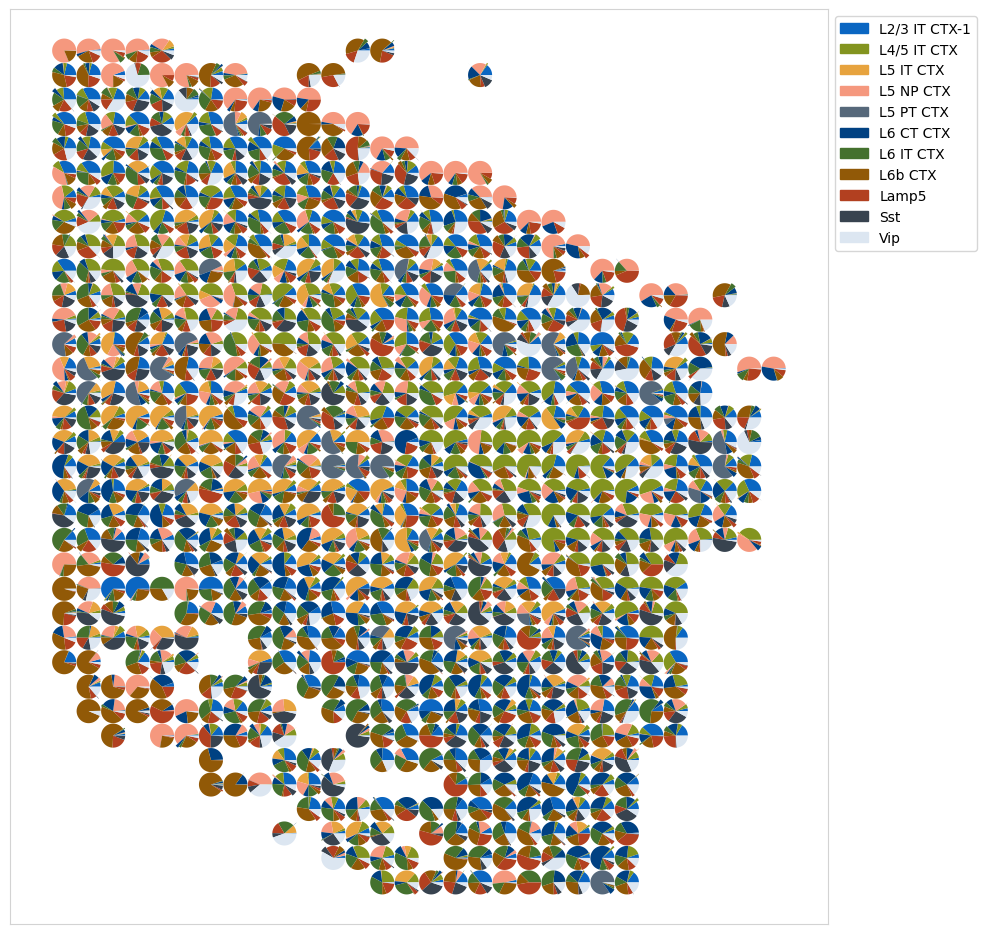

In [14]:
plot_frac_results(np.array(tangram_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/tangram_results_pie_plot.jpg', color_dict=color_dict)

In [15]:
cell2loc_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/Cell2location/Cell2location_result.csv',index_col=0)
cell2loc_results.index = np.arange(len(cell2loc_results))
cell2loc_results = (cell2loc_results.T/cell2loc_results.sum(axis=1)).T
cell2loc_results = cell2loc_results.loc[:,np.unique(cell2loc_results.columns)]

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

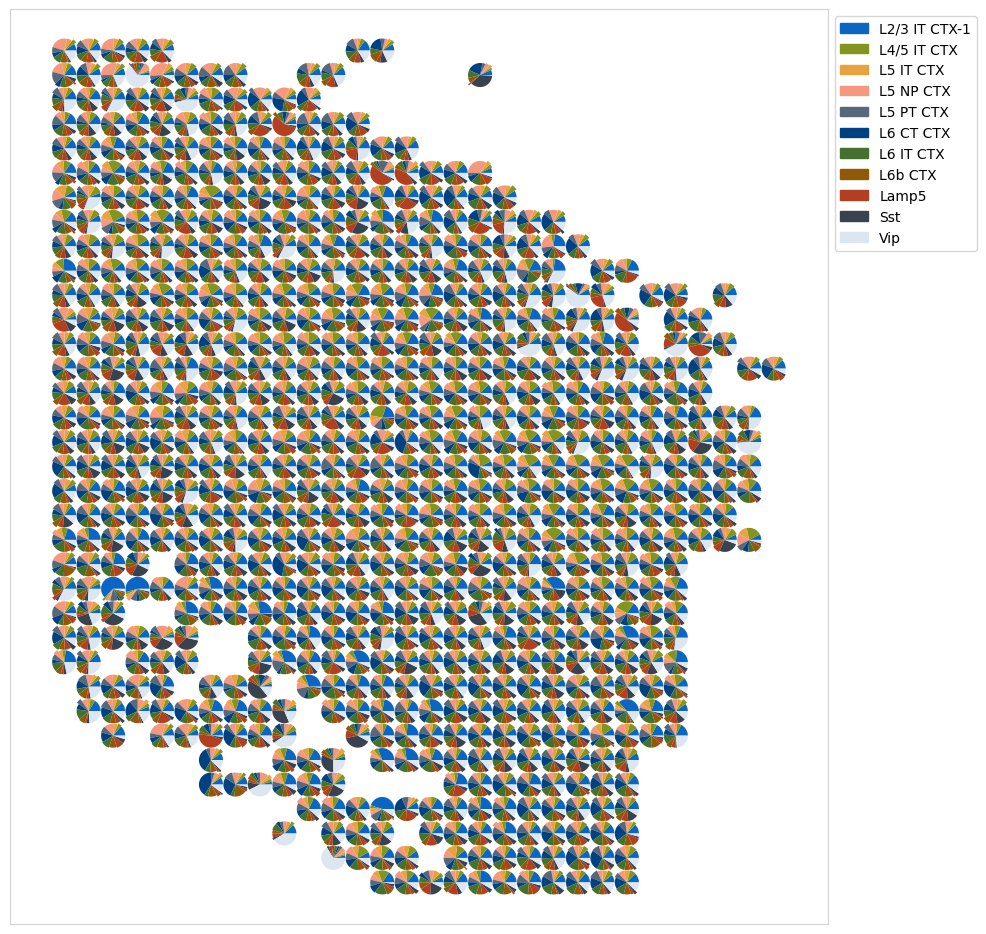

In [16]:
plot_frac_results(np.array(cell2loc_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/cell2loc_results_pie_plot.jpg', color_dict=color_dict)

In [17]:
RCTD_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/RCTD/rctd_bench.csv',index_col=0)
RCTD_results.index = np.arange(len(RCTD_results))
RCTD_results = RCTD_results.loc[:,np.unique(RCTD_results.columns)]
RCTD_results.columns = tangram_results.columns

In [18]:
RCTD_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/RCTD/rctd_bench.csv',index_col=0)
RCTD_results

,L2-3 IT CTX-1,L4-5 IT CTX,L5 IT CTX,L5 NP CTX,L5 PT CTX,L6 CT CTX,L6 IT CTX,L6b CTX,Lamp5,Sst,Vip
barcodes,,,,,,,,,,,
400_27600,0.000092,0.002910,0.000092,0.000092,0.000092,0.000092,0.000092,0.934918,0.057140,0.001385,0.003093
400_28400,0.000016,0.000181,0.000013,0.000014,0.000013,0.155631,0.015284,0.814205,0.012793,0.000564,0.001285
400_30000,0.000141,0.000141,0.000141,0.038161,0.000141,0.000141,0.037736,0.872142,0.045604,0.000141,0.005512
400_30800,0.000073,0.000073,0.000073,0.036985,0.000073,0.000073,0.000073,0.947602,0.014635,0.000073,0.000267
400_31600,0.000153,0.000153,0.000153,0.000170,0.000153,0.000183,0.000153,0.894458,0.090267,0.000153,0.014002
...,...,...,...,...,...,...,...,...,...,...,...
22800_33200,0.385375,0.000109,0.000109,0.000109,0.255345,0.000109,0.047281,0.295966,0.008782,0.003626,0.003189
22800_34000,0.259522,0.000088,0.000088,0.000088,0.134886,0.000088,0.000088,0.576070,0.024071,0.000088,0.004921
22800_34800,0.081414,0.000039,0.000039,0.000039,0.004785,0.107593,0.165153,0.334080,0.091579,0.000039,0.215238


In [19]:
RCTD_coordinates_x = RCTD_results.index.map(lambda x: float(x.split('_')[0])/800)
RCTD_coordinates_y = RCTD_results.index.map(lambda x: float(x.split('_')[1])/800)
RCTD_coordinates = list(zip(RCTD_coordinates_x, RCTD_coordinates_y))
RCTD_coordinates = pd.DataFrame(RCTD_coordinates, columns=['coor_X', 'coor_Y'])
RCTD_coordinates

,coor_X,coor_Y
0,0.5,34.5
1,0.5,35.5
2,0.5,37.5
3,0.5,38.5
4,0.5,39.5
...,...,...
723,28.5,41.5
724,28.5,42.5
725,28.5,43.5
726,28.5,46.5


In [20]:
coordinates.columns = ['coor_X', 'coor_Y']
merged_coordinates = pd.merge(coordinates, RCTD_coordinates, on=['coor_X', 'coor_Y'], how='left', indicator=True)
both = merged_coordinates[merged_coordinates['_merge'] == 'both']
both_index = both.index
both_index

Index([  0,   1,   3,   4,   5,   6,   7,   8,   9,  10,
       ...
       726, 727, 728, 729, 730, 731, 732, 733, 735, 736],
      dtype='int64', length=728)

Plotting pie plots::   0%|          | 0/728 [00:00<?, ?it/s]

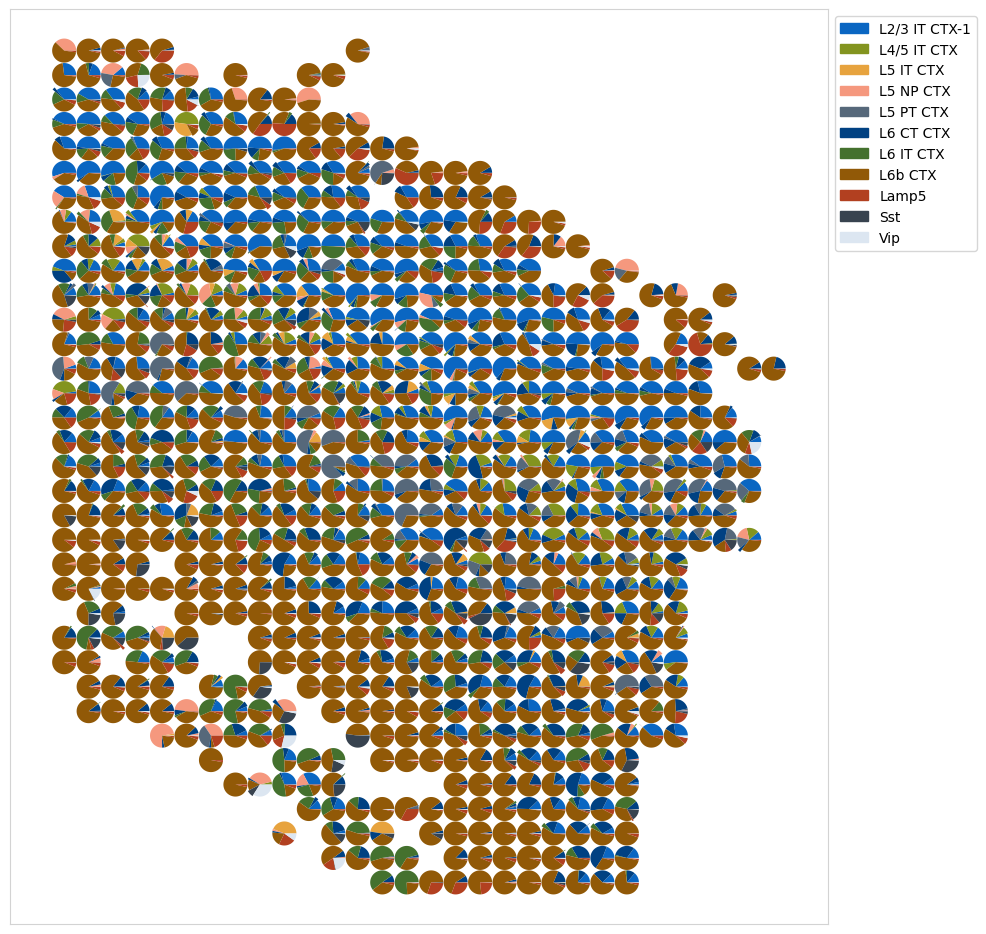

In [21]:
plot_frac_results(np.array(RCTD_results), cell_type_list, RCTD_coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/RCTD_results_pie_plot.jpg', color_dict=color_dict)

In [22]:
spatialdwls_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/SpatialDWLS/SpatialDWLS_result.csv',index_col=0)
spatialdwls_results.index = np.arange(len(spatialdwls_results))
spatialdwls_results = spatialdwls_results.iloc[:,1:]
spatialdwls_results = spatialdwls_results.loc[:,np.unique(spatialdwls_results.columns)]

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

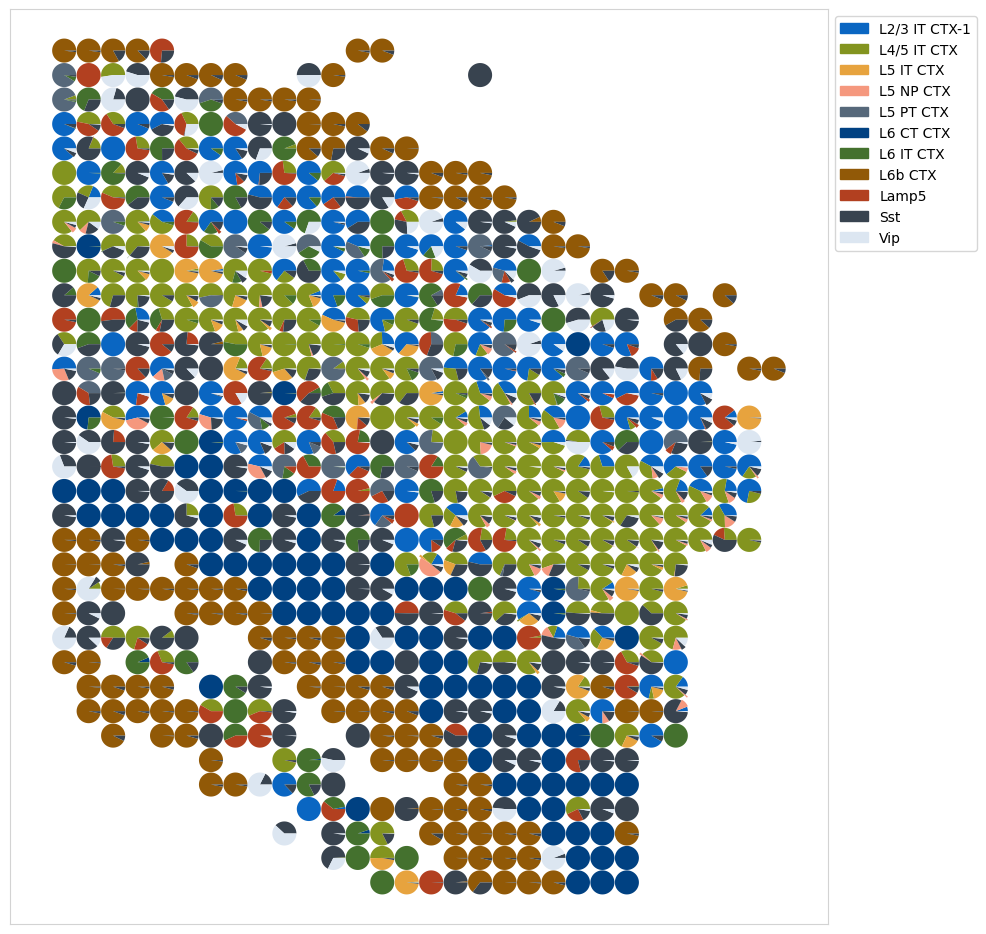

In [23]:
plot_frac_results(np.array(spatialdwls_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/spatialdwls_results_pie_plot.jpg', color_dict=color_dict)

In [24]:
stereo_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/Stereoscope/Stereoscope_result.csv',index_col=0)
stereo_results.index = np.arange(len(stereo_results))
stereo_results = stereo_results.loc[:,np.unique(stereo_results.columns)]

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

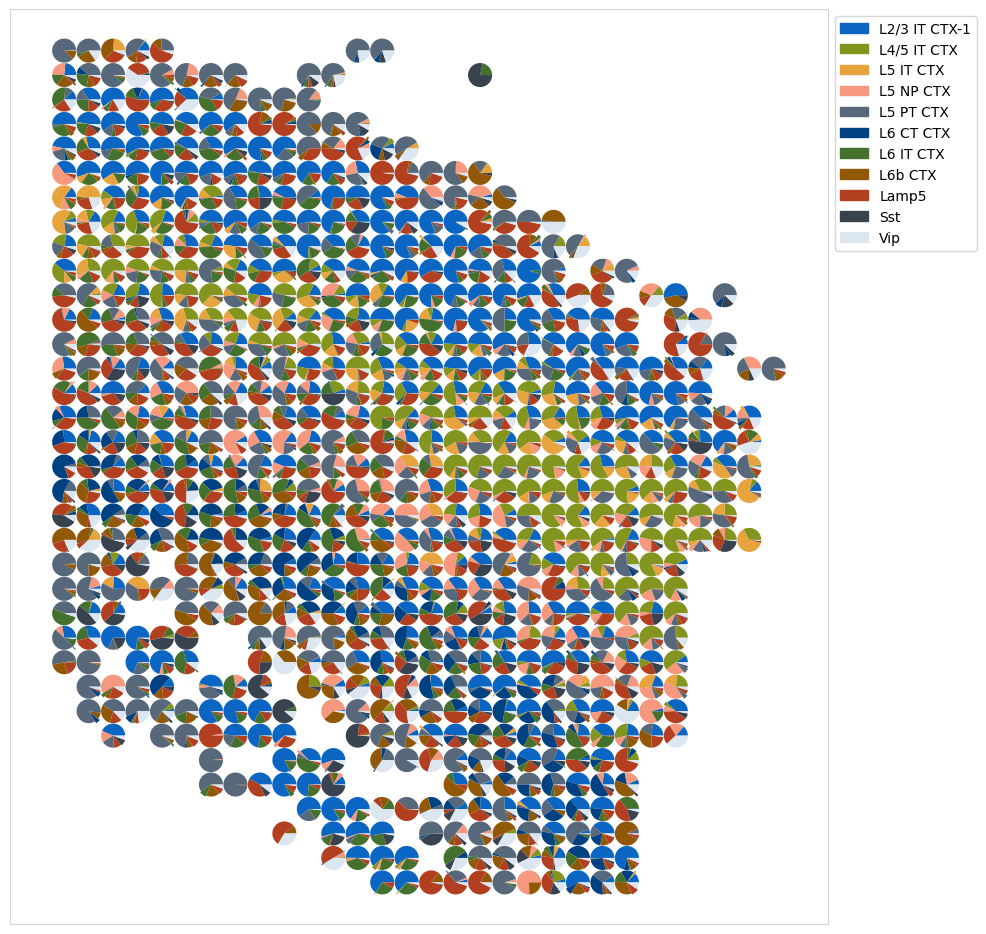

In [25]:
plot_frac_results(np.array(stereo_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/stereo_results_pie_plot.jpg', color_dict=color_dict)

In [26]:
spotlight_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/Spotlight/SPOTlight_output.csv',index_col=0)
spotlight_results.index = np.arange(len(spotlight_results))
spotlight_results = spotlight_results.loc[:,np.unique(spotlight_results.columns)]

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

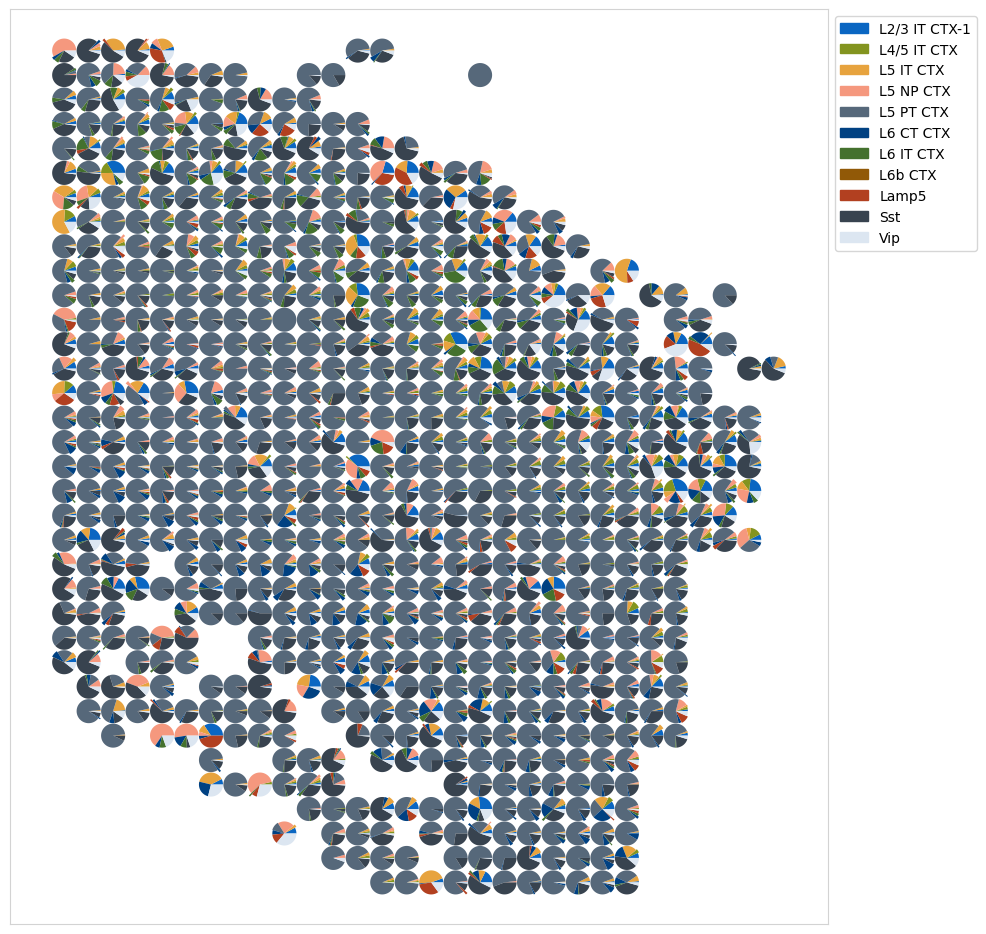

In [27]:
plot_frac_results(np.array(spotlight_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/spotlight_results_pie_plot.jpg', color_dict=color_dict)

In [28]:
red_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/Redeconve/Redeconve.csv',index_col=0)
red_results.index = np.arange(len(red_results))
red_results = red_results.loc[:,np.unique(red_results.columns)]

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

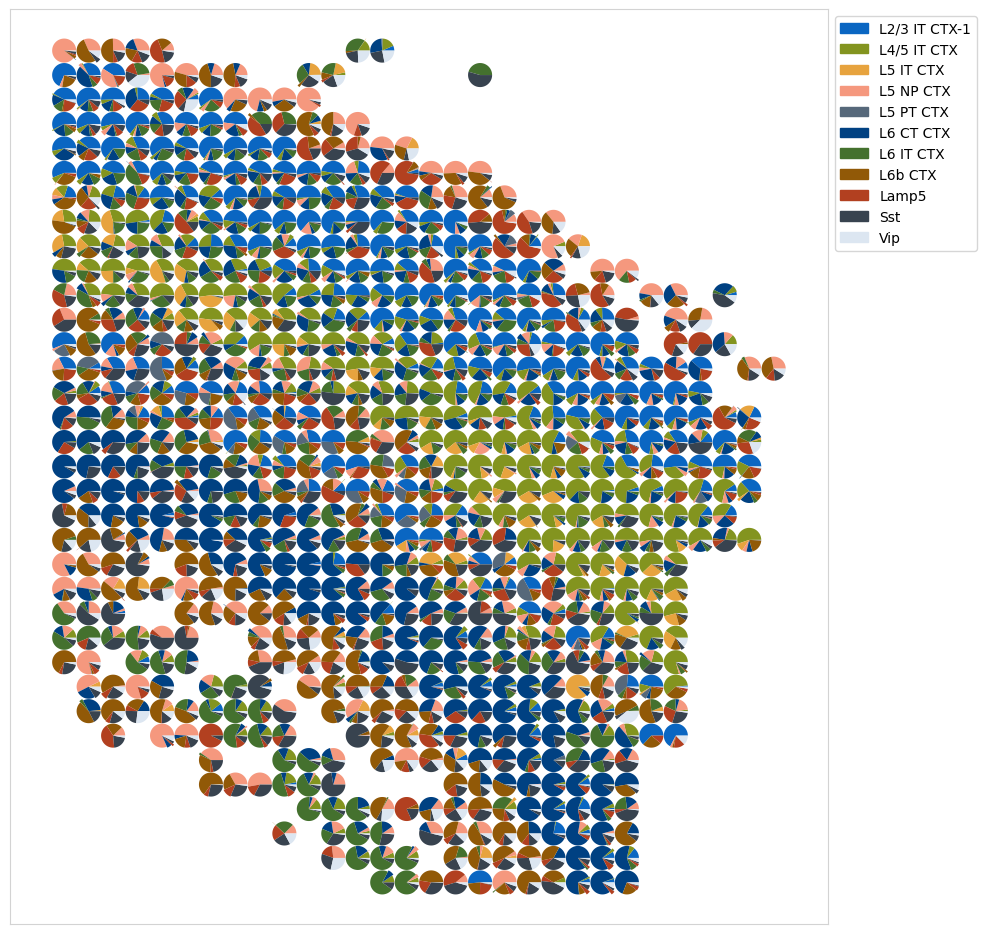

In [29]:
plot_frac_results(np.array(red_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/red_results_pie_plot.jpg', color_dict=color_dict)

In [30]:
dstg_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/DSTG/predict_output.csv',index_col=0)
dstg_results = (dstg_results.T/dstg_results.sum(axis=1)).T
dstg_results = dstg_results.loc[:,np.unique(dstg_results.columns)]

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

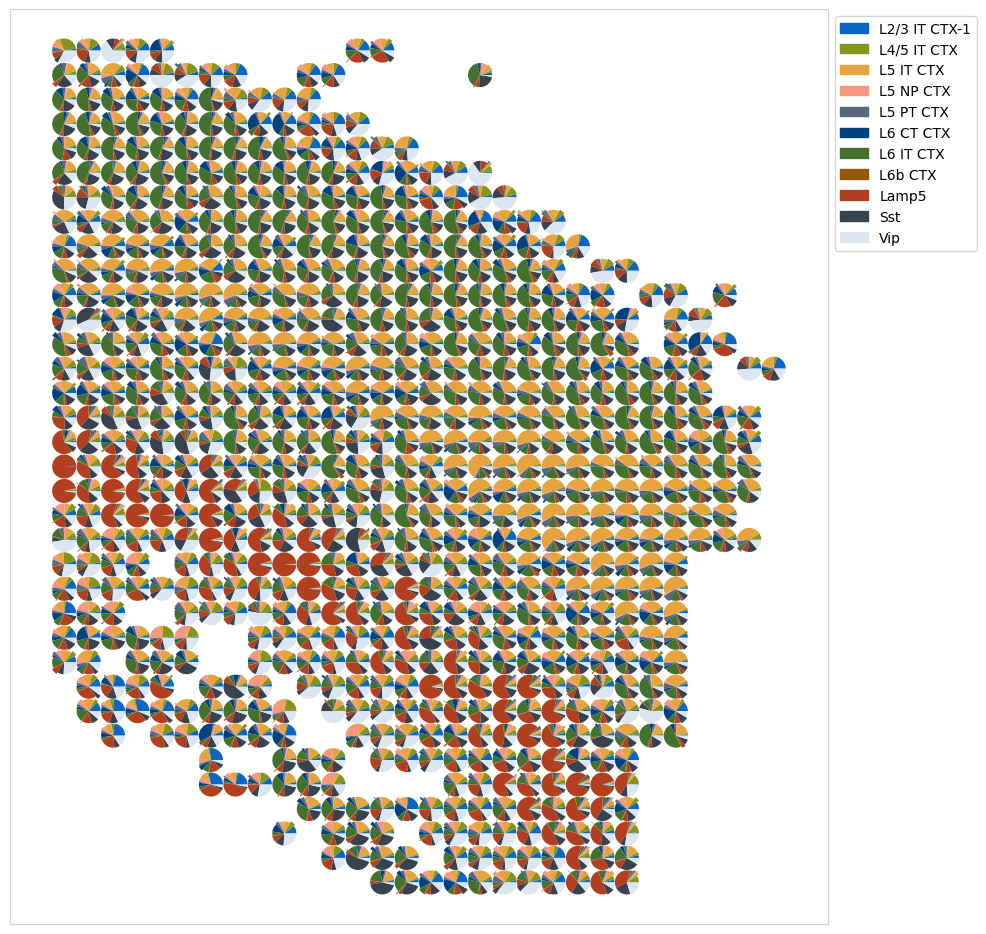

In [31]:
plot_frac_results(np.array(dstg_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/dstg_results_pie_plot.jpg', color_dict=color_dict)

In [32]:
card_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/CARD/CARD_output.csv')
card_results.index = np.arange(len(card_results))
card_results = card_results.loc[:,np.unique(card_results.columns)]

Plotting pie plots::   0%|          | 0/728 [00:00<?, ?it/s]

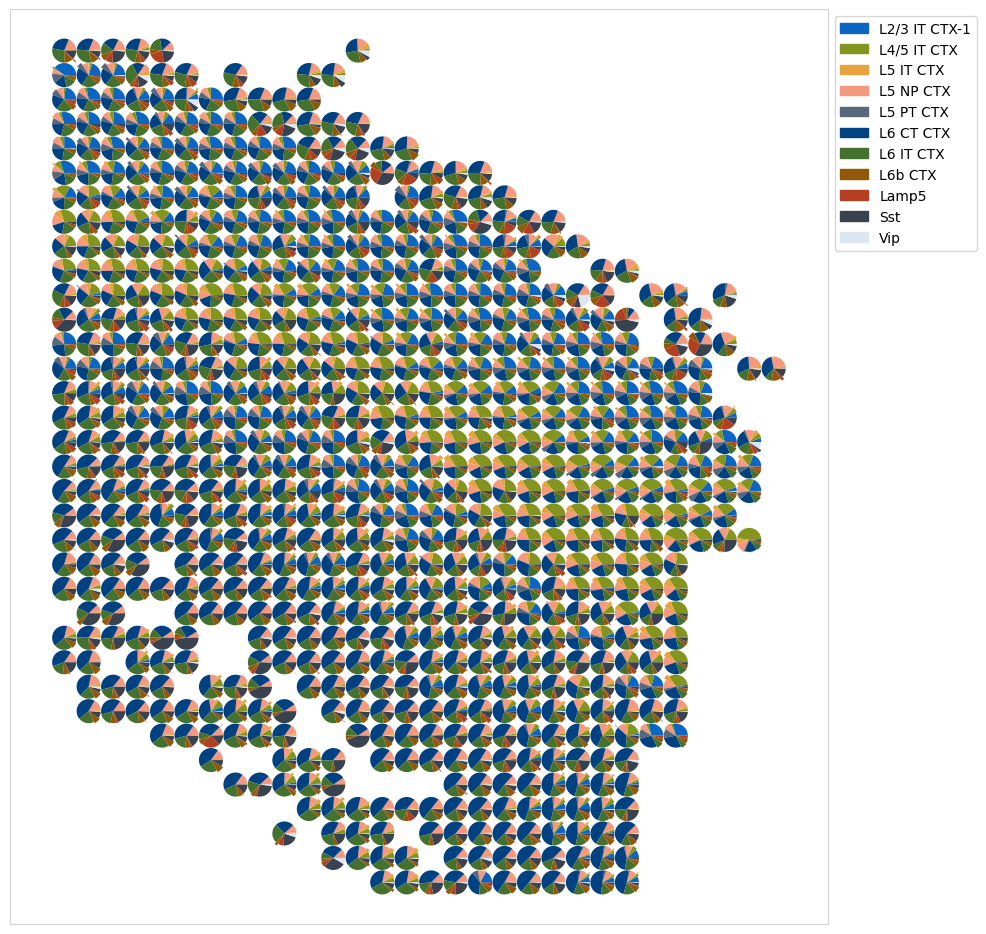

In [33]:
plot_frac_results(np.array(card_results), cell_type_list, RCTD_coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/card_results_pie_plot.jpg', color_dict=color_dict)

In [34]:
stdgcn_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/StdGCN/StdGCN_output.csv',index_col=0)
stdgcn_results.index = np.arange(len(stdgcn_results))
stdgcn_results = stdgcn_results.loc[:,np.unique(stdgcn_results.columns)]

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

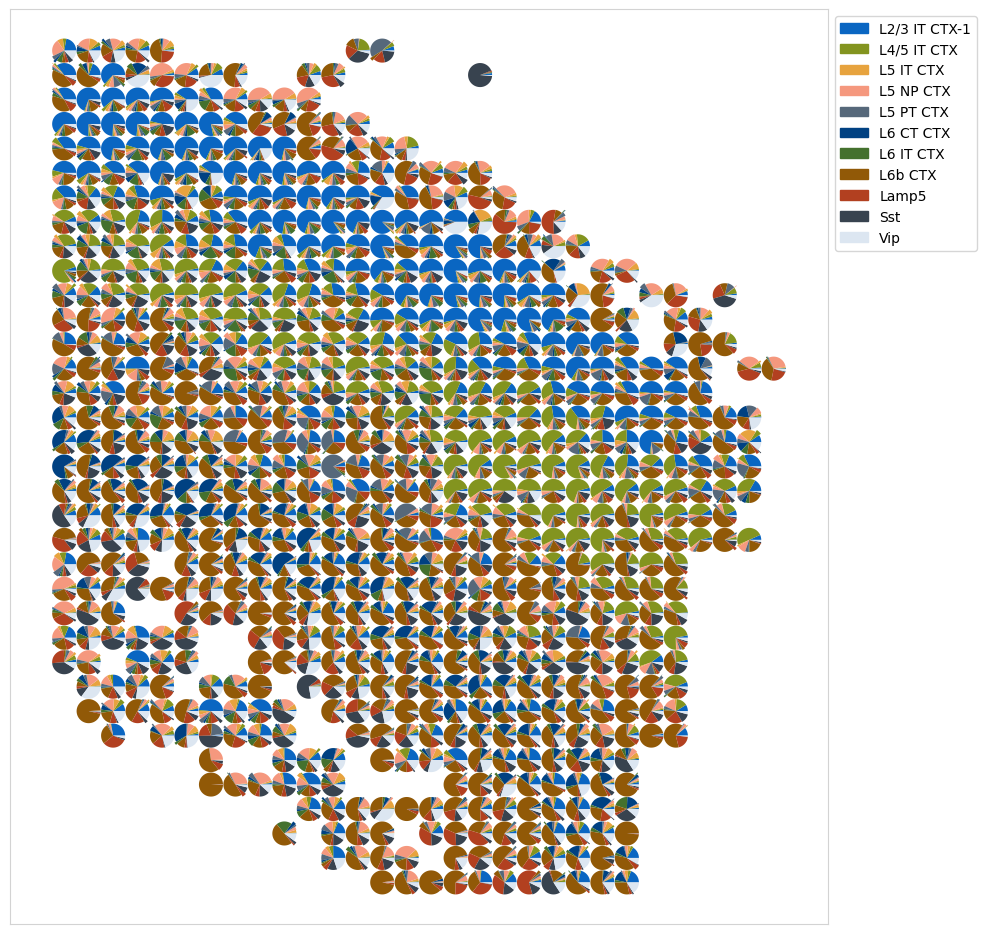

In [35]:
plot_frac_results(np.array(stdgcn_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/stdgcn_results_pie_plot.jpg', color_dict=color_dict)

In [36]:
spacel_results = pd.read_csv('/home/comp/cszrwang/results/Deconvolution/results/osmFISH/SPACEL/SPACEL_result.csv',index_col=0)
spacel_results.index = np.arange(len(spacel_results))
spacel_results = spacel_results.loc[:,np.unique(spacel_results.columns)]

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

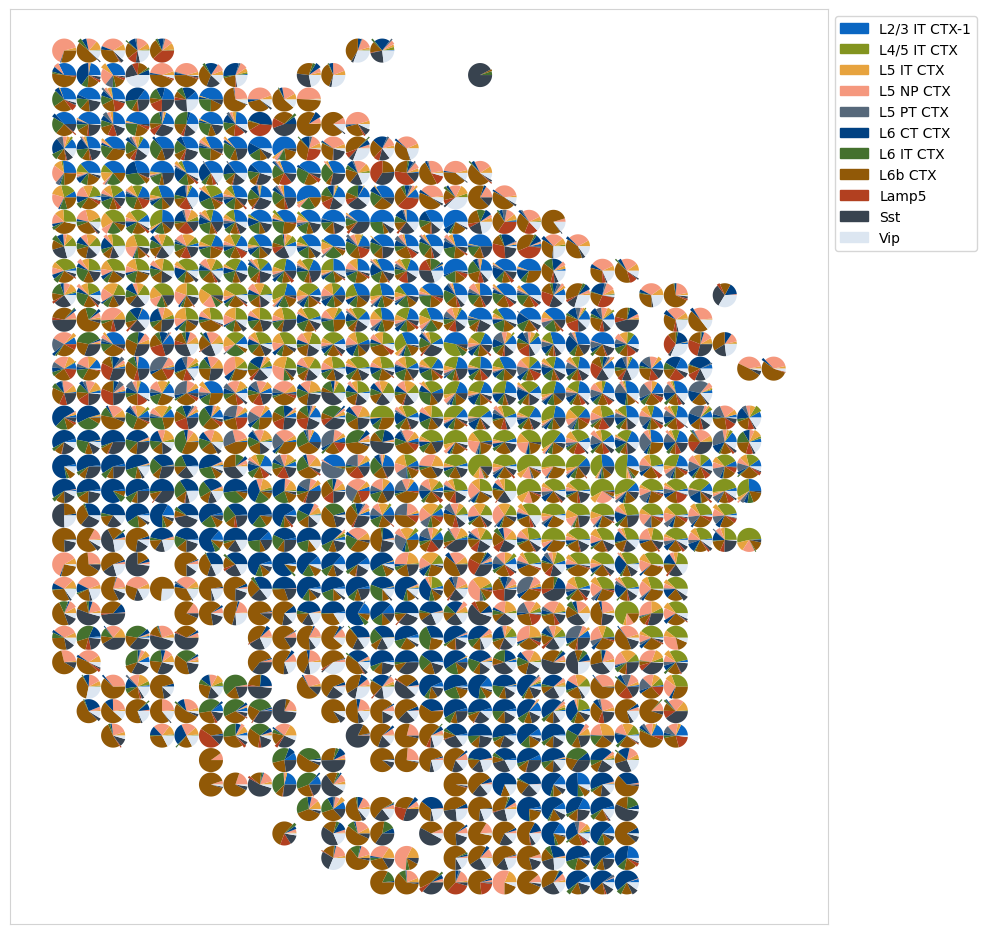

In [37]:
plot_frac_results(np.array(spacel_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/spacel_results_pie_plot.jpg', color_dict=color_dict)

In [39]:
harmo_results = pd.read_csv("/home/comp/cszrwang/project/GMGAT4Deconv/figures/mean_out_osm_20_seed1.model.csv")
harmo_results = harmo_results.loc[:,np.unique(harmo_results.columns)].fillna(0)

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

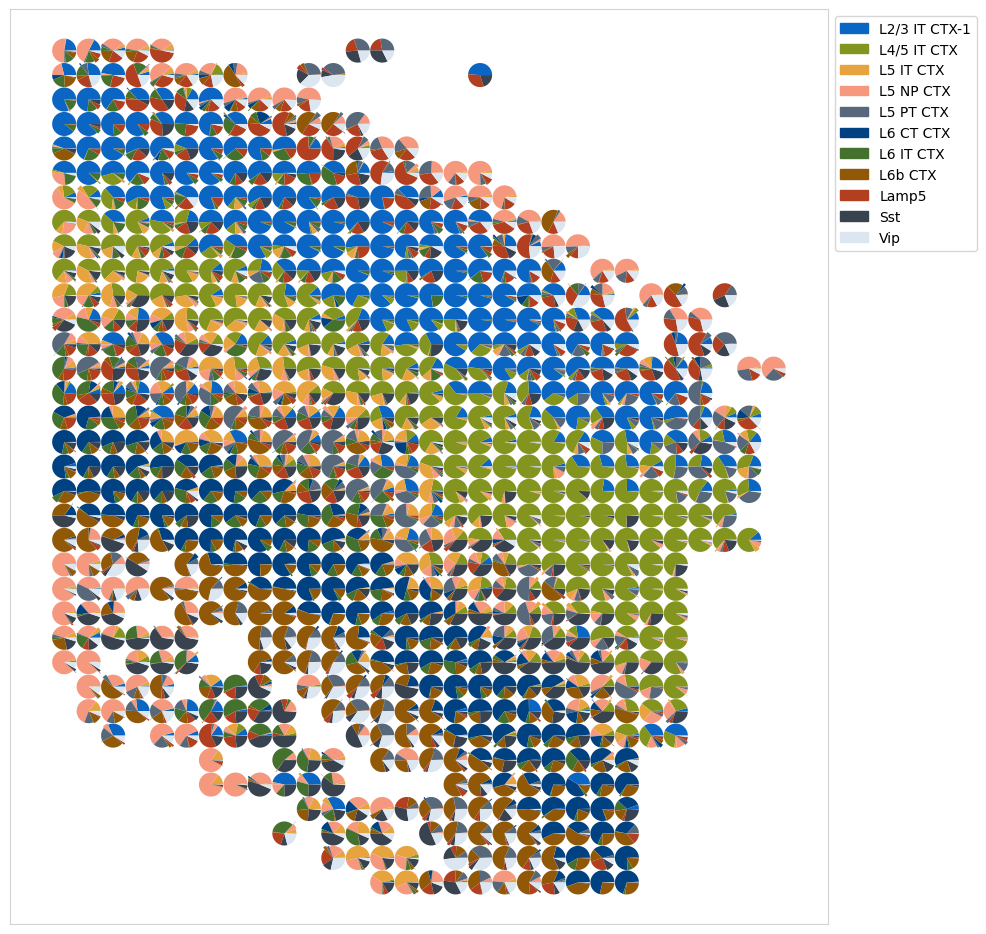

In [40]:
plot_frac_results(np.array(harmo_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/gmgcn_results_pie_plot.jpg', color_dict=color_dict)

Plotting pie plots::   0%|          | 0/737 [00:00<?, ?it/s]

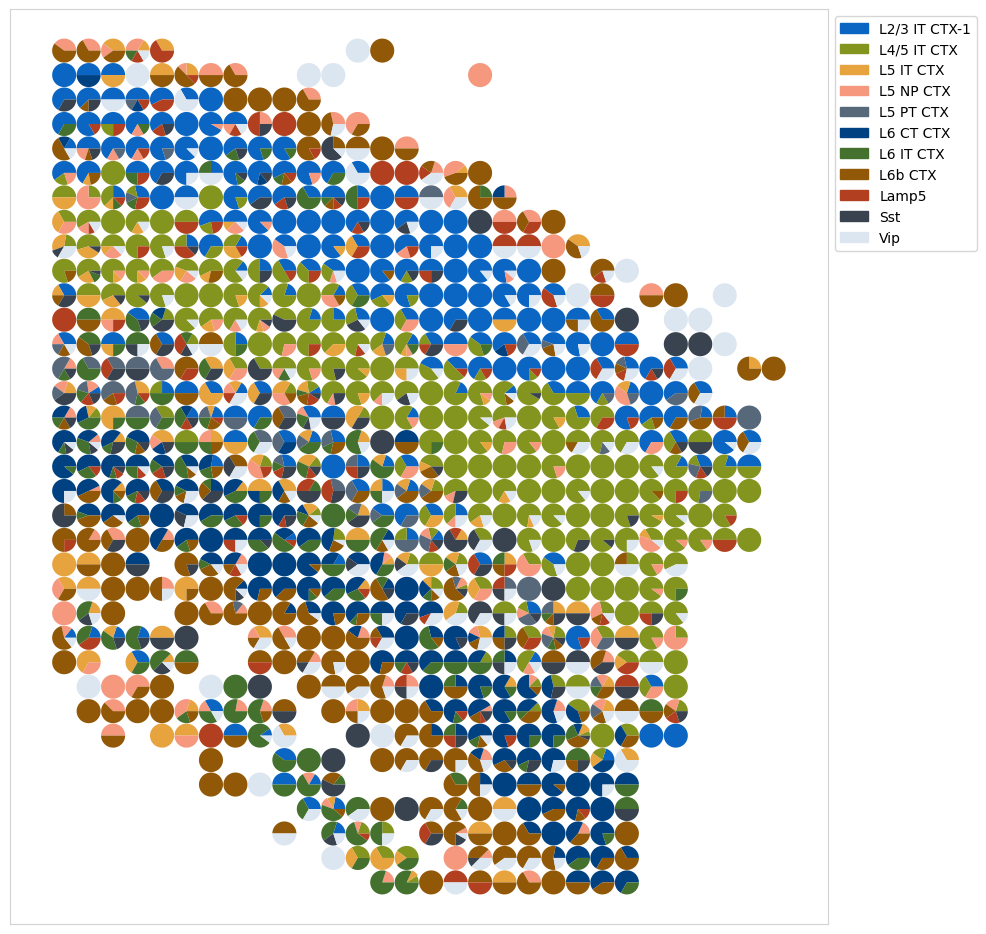

In [41]:
plot_frac_results(np.array(gd_results), cell_type_list, coordinates, point_size=300, size_coefficient=0.0009
                  , file_name=output_dir+'/gd_results_pie_plot.jpg', color_dict=color_dict)

In [42]:
merged_coordinates = pd.merge(coordinates, RCTD_coordinates, on=['coor_X', 'coor_Y'], how='left', indicator=True)
both = merged_coordinates[merged_coordinates['_merge'] == 'both']
both_index = both.index
both_index

Index([  0,   1,   3,   4,   5,   6,   7,   8,   9,  10,
       ...
       726, 727, 728, 729, 730, 731, 732, 733, 735, 736],
      dtype='int64', length=728)

In [43]:
tangram_results = tangram_results.iloc[both_index]

In [44]:
# tangram_results = tangram_results.iloc[both_index]
# seurat_results = seurat_results.iloc[both_index]
red_results = red_results.iloc[both_index]
# RCTD_results = RCTD_results.iloc[both_index]
cell2loc_results = cell2loc_results.iloc[both_index]
stereo_results = stereo_results.iloc[both_index]
spotlight_results = spotlight_results.iloc[both_index]
spatialdwls_results = spatialdwls_results.iloc[both_index]
dstg_results = dstg_results.iloc[both_index]
spacel_results = spacel_results.iloc[both_index]
stdgcn_results = stdgcn_results.iloc[both_index]
# card_results = card_results[both_index]
gd_results = gd_results.iloc[both_index]
harmo_results = harmo_results.iloc[both_index]

In [46]:
column = ['HarmoDecon', 'RCTD', 'Redeconve', 'STdGCN','CARD', 'Cell2location', 'Tangram', 'Stereoscope', 'SPACEL', 'SpatialDWLS', 'SPOTlight', 'DSTG']
results_list = [harmo_results, RCTD_results, red_results, stdgcn_results, card_results, cell2loc_results,
               tangram_results, stereo_results, spacel_results, spatialdwls_results, spotlight_results, dstg_results]
# for i in results_list:
#     print(len(i))
starmap_spots_pcc = compare_results(
    gd_results,
    results_list,
    columns = column,
    axis=0,
    metric='pcc'
)

starmap_spots_ssim = compare_results(
    gd_results,
    results_list,
    columns = column,
    axis=0,
    metric='ssim'
)

starmap_spots_rmse = compare_results(
    gd_results,
    results_list,
    columns = column,
    axis=0,
    metric='rmse'
)

starmap_spots_jsd = compare_results(
    gd_results,
    results_list,
    columns = column,
    axis=0,
    metric='jsd'
)

In [47]:
pcc_rank = starmap_spots_pcc.apply(lambda x: x.rank(), axis=1)
ssim_rank = starmap_spots_ssim.apply(lambda x: x.rank(), axis=1)
jsd_rank = starmap_spots_jsd.apply(lambda x: x.rank(ascending=False), axis=1)
rmse_rank = starmap_spots_rmse.apply(lambda x: x.rank(ascending=False), axis=1)
rank_sum = pd.DataFrame((pcc_rank + ssim_rank + jsd_rank + rmse_rank) / 48)

/tmp/ipykernel_4096938/376106343.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

  sns.barplot(data=rank_sum,palette=colors, capsize=0.1, ci=95, errwidth=1.5, orient='h', edgecolor='black', linewidth=2)
/home/comp/cszrwang/anaconda3/envs/dl_transformer/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/comp/cszrwang/anaconda3/envs/dl_transformer/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/comp/cszrwang/anaconda3/envs/dl_transformer/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and 

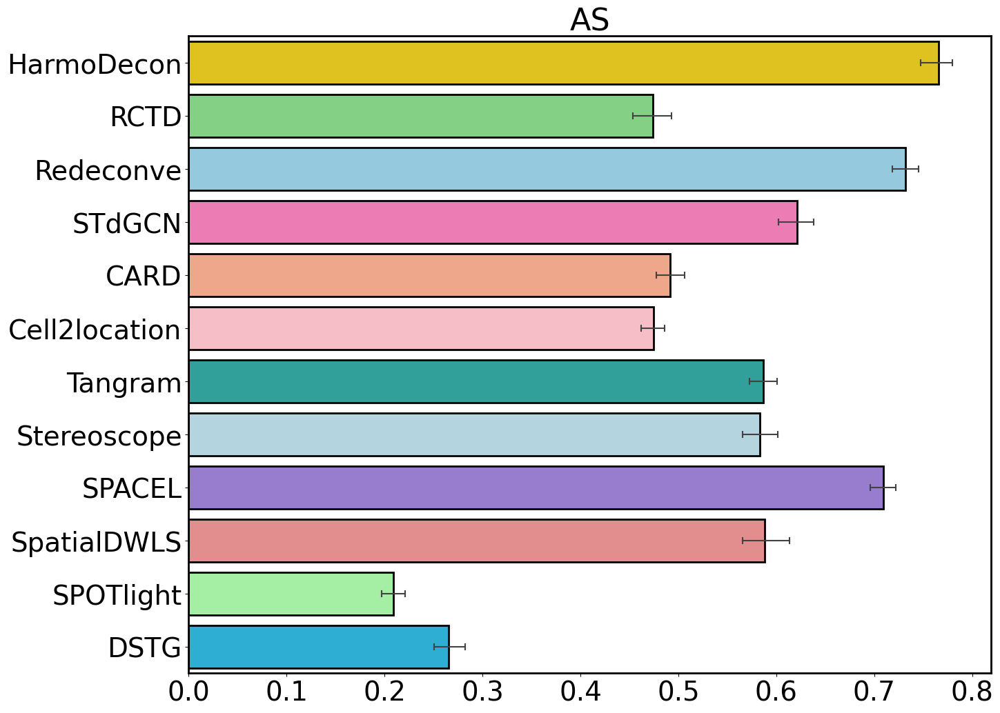

In [53]:
fig,axes = plt.subplots(ncols=1,nrows=1,figsize=(15,12))
# order = ['HarmoDecon', 'RCTD', 'StdGCN', 'SPOTlight', 'Cell2location', 'Tangram', 'Stereoscope', 'SPACEL', 'SpatialDWLS','Redeconve', 'CARD', 'DSTG']
colors = ['#FFD700', '#77DD77', '#87CEEB', '#FF69B4', '#FFA07A', '#FFB6C1', '#20B2AA', '#ADD8E6', '#9370DB', '#F08080', '#98FB98', '#11BEEE']
sns.barplot(data=rank_sum,palette=colors, capsize=0.1, ci=95, errwidth=1.5, orient='h', edgecolor='black', linewidth=2)
axes.set_title('AS', fontsize=32)

# Get the current axes
ax = plt.gca()

# Customize the border of the plot box
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
ax.spines['top'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.set_yticklabels(column)
# ax.yaxis.set_visible(False)

plt.xticks(fontsize=28)
plt.yticks(fontsize=28)
plt.savefig(output_dir+'/box_AS.jpg',dpi=300,bbox_inches='tight')
plt.show()

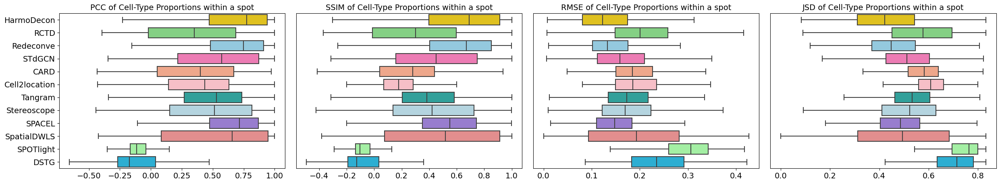

In [54]:
fig,axes = plt.subplots(ncols=4,nrows=1,figsize=(30,5))
plt.subplots_adjust(wspace=0.05, hspace=0.2)
# order = ['HarmoDecon', 'RCTD', 'StdGCN', 'SPOTlight', 'Cell2location', 'Tangram', 'Stereoscope', 'SPACEL', 'SpatialDWLS', 'Redeconve','CARD', 'DSTG']
order = list(rank_sum.columns)
colors = ['#FFD700', '#77DD77', '#87CEEB', '#FF69B4', '#FFA07A', '#FFB6C1', '#20B2AA', '#ADD8E6', '#9370DB', '#F08080', '#98FB98', '#11BEEE']
# colors = ["#9de846", '#F9EC31', "#BBA8D1","#D6DE23", "#7BD1F1", "#F5A8C7",  "#A2CBCF", "#988DC3", "#79c06e",'#00CED1',"#BBA8D1", "#9dff46", "#E6AB02", "#FCCDE5", "#CCFFFF", "#dddddd", "#cccccc", "#aaaaaa"]
# colors = ["#9de846", '#F9EC31', "#BBA8D1","#D6DE23", "#7BD1F1", "#F5A8C7",]
# order_plt = ['mse_recon_js_ce','mse_recon_js', 'mse_recon_ce', 'mse_js_ce','mse','mse_ce','mse_recon']
sns.boxplot(data=starmap_spots_pcc,order=order,palette=colors,ax=axes[0],orient='h', showfliers = False)
axes[0].set_title('PCC of Cell-Type Proportions within a spot', size = 14)
sns.boxplot(data=starmap_spots_ssim,order=order,palette=colors,ax=axes[1],orient='h', showfliers = False)
axes[1].set_title('SSIM of Cell-Type Proportions within a spot', size = 14)
axes[1].set_yticklabels([])
axes[1].yaxis.set_visible(False)
sns.boxplot(data=starmap_spots_rmse,order=order,palette=colors,ax=axes[2],orient='h', showfliers = False)
axes[2].set_title('RMSE of Cell-Type Proportions within a spot', size = 14)
axes[2].set_yticklabels([])
axes[2].yaxis.set_visible(False)
sns.boxplot(data=starmap_spots_jsd,order=order,palette=colors,ax=axes[3],orient='h', showfliers = False)
axes[3].set_title('JSD of Cell-Type Proportions within a spot', size = 14)
axes[3].set_yticklabels([])
axes[3].yaxis.set_visible(False)
for i, ax in enumerate(axes.flat):
    if i in [0,2]:
        ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14)
plt.savefig(output_dir+'/criterion_box_plot_Red.jpg',dpi=300,bbox_inches='tight')
plt.show()

In [55]:
from scipy.stats import linregress

In [56]:
out_dir_linear = output_dir + "/linear"

In [61]:
def plot_linear(out_dir, column, results_list, legend=True, yticks=True):
    p_list = []
    r_list = []
    mse_list = []
    gd_results_cells = pd.read_table('/home/comp/cszrwang/data/osmfish/osmfish.cell_proportion.txt', sep = '\t', header = 0, index_col = 0)
    y = gd_results_cells.sum() / gd_results_cells.sum().sum()
    for name, result in zip(column, results_list):
        x = result.mean() / result.mean().sum()
        slope, intercept, r_value, p_value, std_err = linregress(x, y)
        p_list.append(p_value)
        r_list.append(pow(r_value, 2))

        # Create a list of labels for each point
        labels = x.index

        # Create a list of colors for each point
#         colors = ['red', 'green', 'blue', 'orange', 'purple', 'yellow', 'pink', 'cyan', 'magenta', 'brown', 'gray']
        colors = ['#0a66c2', '#83941f', '#e7a33e', '#f5987e','#56687a', '#004182', '#44712e', '#915907', '#b24020', '#38434f', '#dce6f1']

        # Plot the figure
        fig, ax = plt.subplots()
        ax.scatter(x, y, label='Data', color=colors)
        ax.plot(x, slope*x + intercept, color='black', label='Linear Regression')
#         ax.set_xlabel('Predicted cell type fractions', fontsize=14)
#         ax.set_ylabel('Expected cell type fractions', fontsize=14)
        ax.set_title(f'{name}', fontsize=16)
        
        ax.tick_params(axis='y', labelsize=14)
        ax.tick_params(axis='x', labelsize=14)
        if not yticks:
            ax.set_yticklabels([])
            name = name + "no_ticks"
            ax.yaxis.set_visible(False)

        # Remove top and right spines
#         ax.spines['top'].set_visible(False)
#         ax.spines['right'].set_visible(False)

        # Add custom legend with labels and colors
        handles = []
        for i in range(len(labels)):
            handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[i], markersize=8, label=labels[i]))

        # Move legend outside the figure
        if legend:
            ax.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5))

        # Calculate the predicted values
        predicted_values = slope*x + intercept

        # Calculate the Mean Squared Error
        mse = mean_squared_error(y, predicted_values)
        
        r_square = pow(r_value, 2)
        rmse = pow(mse, 0.5)
        mse_list.append(rmse)

        # Add p-value, r-value, and MSE as text in the top left corner
        ax.text(0.02, 0.98, f'$r^2 = {r_square:.2f}$\n$p = {p_value:.2g}$\n$RMSE = {rmse:.2g}$', transform=ax.transAxes, verticalalignment='top', horizontalalignment='left', fontsize=14)

        if not legend:
            name = name + "no_legend"
        plt.savefig(out_dir + f'/{name}_linear.jpg', dpi=300, bbox_inches='tight')
        plt.show()

        # Print the results
        print('Slope:', slope)
        print('Intercept:', intercept)
        print('Pearson correlation coefficient (r):', r_value)
        print('p-value:', p_value)
        print('r_value:', r_value)
    return p_list, r_list, mse_list

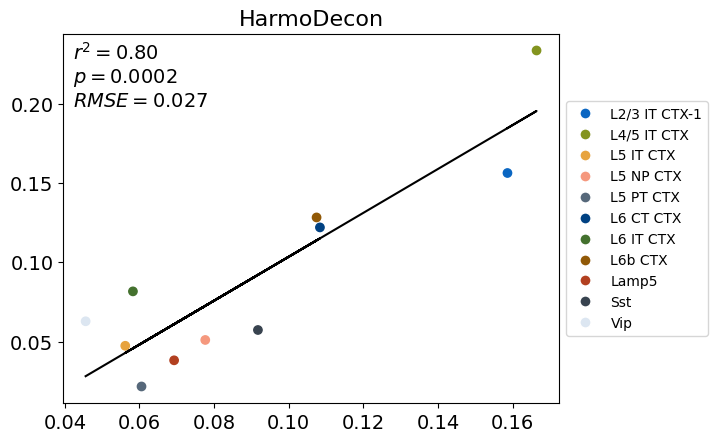

Slope: 1.3831358655611898
Intercept: -0.034830533232835414
Pearson correlation coefficient (r): 0.895159282764338
p-value: 0.00019647076654360146
r_value: 0.895159282764338


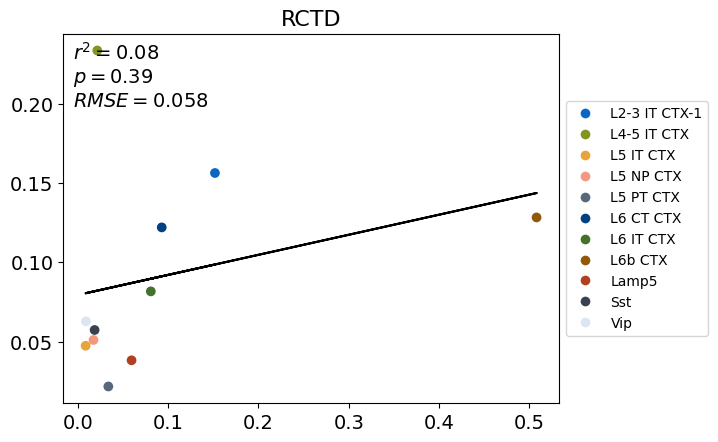

Slope: 0.1262926568436226
Intercept: 0.0794279402869434
Pearson correlation coefficient (r): 0.2903654482420215
p-value: 0.3863863416242963
r_value: 0.2903654482420215


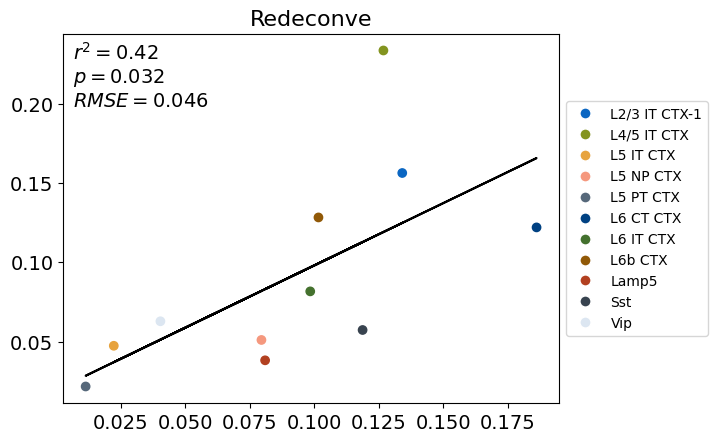

Slope: 0.7850013967223901
Intercept: 0.019545327570691814
Pearson correlation coefficient (r): 0.6446599628842917
p-value: 0.032244215506783296
r_value: 0.6446599628842917


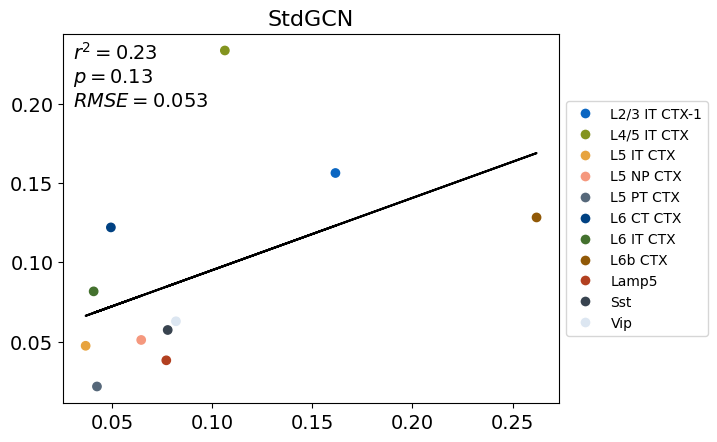

Slope: 0.4551299510702365
Intercept: 0.049533640811796675
Pearson correlation coefficient (r): 0.4837513674556388
p-value: 0.13165589091260263
r_value: 0.4837513674556388


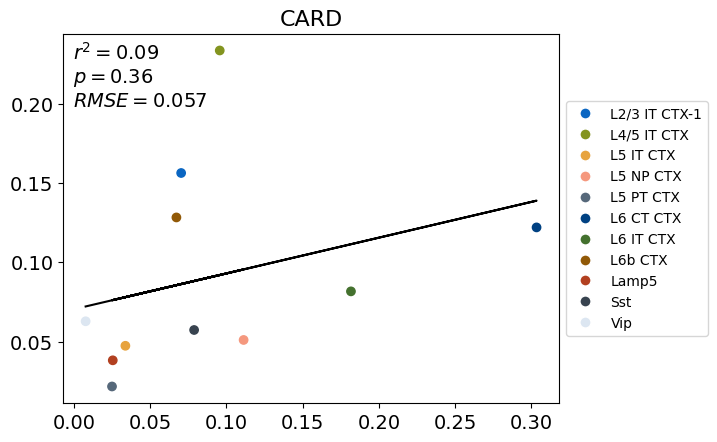

Slope: 0.22541133042716086
Intercept: 0.07041715177934901
Pearson correlation coefficient (r): 0.3061490452104325
p-value: 0.3598649855498097
r_value: 0.3061490452104325


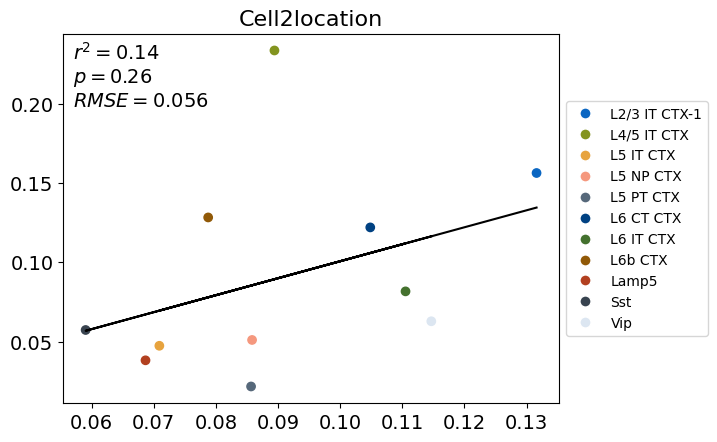

Slope: 1.070121970844661
Intercept: -0.006374724622241909
Pearson correlation coefficient (r): 0.3749904465737043
p-value: 0.2558149448406793
r_value: 0.3749904465737043


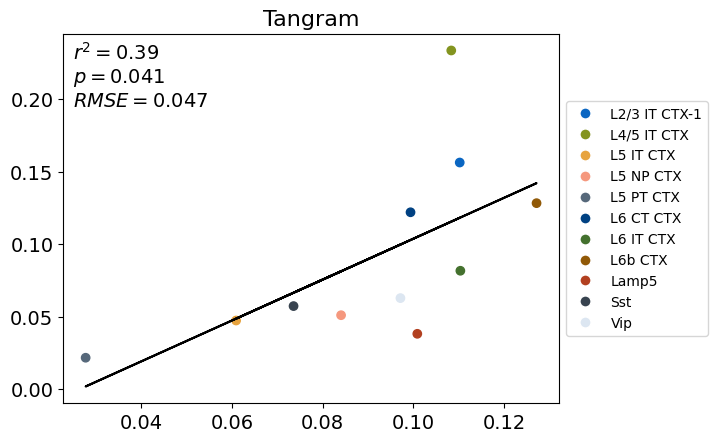

Slope: 1.4083090968224816
Intercept: -0.037119008802043774
Pearson correlation coefficient (r): 0.6230077526594017
p-value: 0.040597542405982796
r_value: 0.6230077526594017


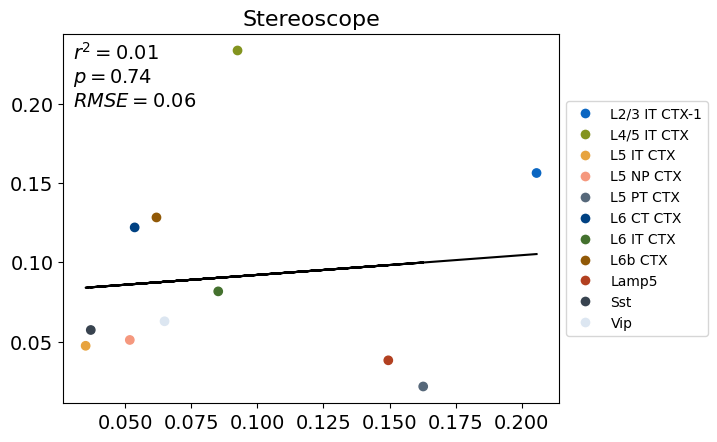

Slope: 0.12427664480869526
Intercept: 0.07961121410830044
Pearson correlation coefficient (r): 0.11156079601512667
p-value: 0.7439994618677326
r_value: 0.11156079601512667


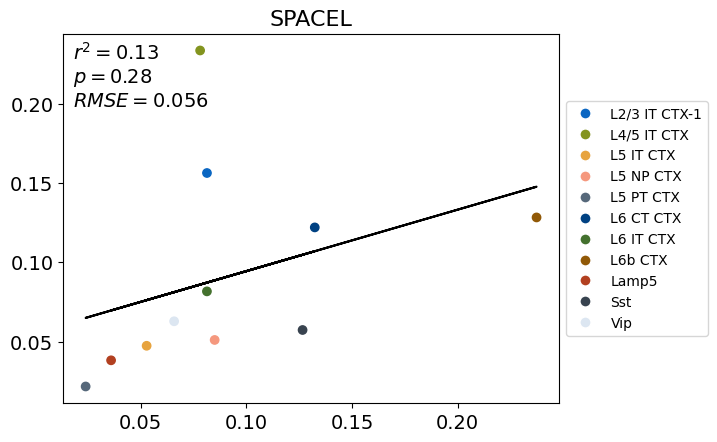

Slope: 0.3871769806099415
Intercept: 0.05571118358091441
Pearson correlation coefficient (r): 0.35920995044892773
p-value: 0.2779514066274761
r_value: 0.35920995044892773


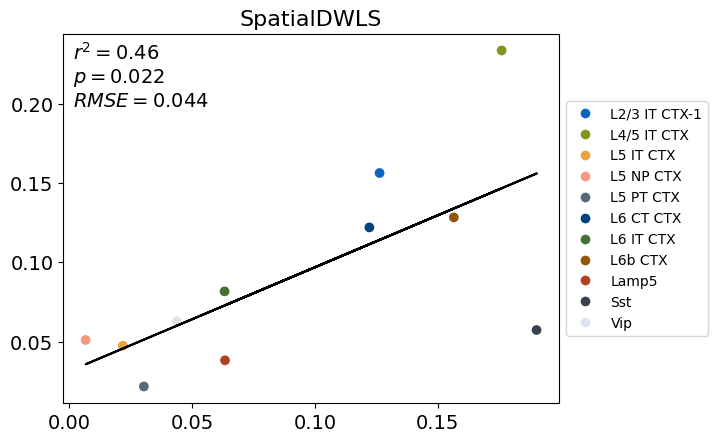

Slope: 0.6552304373079159
Intercept: 0.03134268751746219
Pearson correlation coefficient (r): 0.6785047866496267
p-value: 0.021720440417789522
r_value: 0.6785047866496267


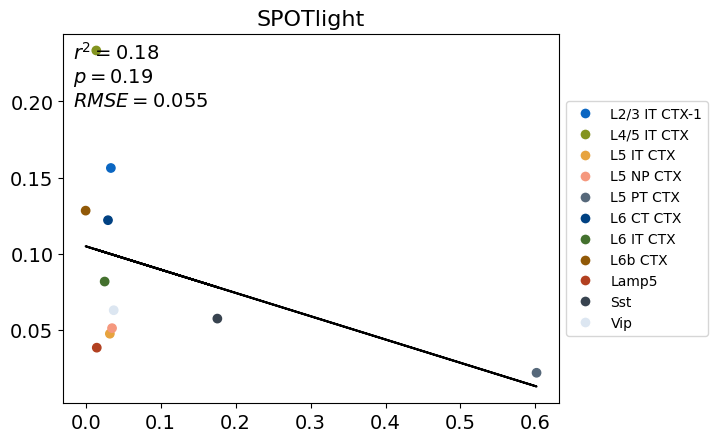

Slope: -0.15314789446320415
Intercept: 0.1048316267693822
Pearson correlation coefficient (r): -0.4253309899260596
p-value: 0.192184223762865
r_value: -0.4253309899260596


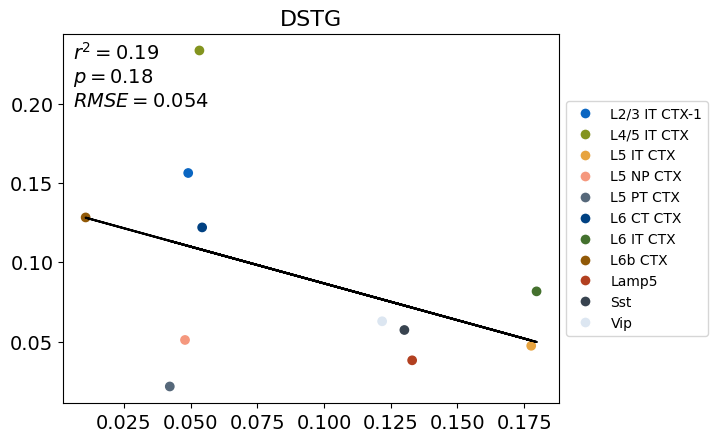

Slope: -0.4635794329025421
Intercept: 0.13305267571841292
Pearson correlation coefficient (r): -0.4324674045619959
p-value: 0.1840277320674812
r_value: -0.4324674045619959


In [62]:
out_dir_linear = output_dir + "/linear"
column = ['HarmoDecon', 'RCTD', 'Redeconve', 'StdGCN','CARD', 'Cell2location', 'Tangram', 'Stereoscope', 'SPACEL', 'SpatialDWLS', 'SPOTlight', 'DSTG']
results_list = [harmo_results, RCTD_results, red_results, stdgcn_results, card_results, cell2loc_results,
               tangram_results, stereo_results, spacel_results, spatialdwls_results, spotlight_results, dstg_results]
p_list, r_list, mse = plot_linear(out_dir_linear, column, results_list)

/tmp/ipykernel_4096938/599570330.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0].set_yticklabels(labels[::-1], fontsize=20)  # Increase fontsize to 14
/tmp/ipykernel_4096938/599570330.py:38: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1].set_yticklabels(labels[::-1], fontsize=20)  # Increase fontsize to 14


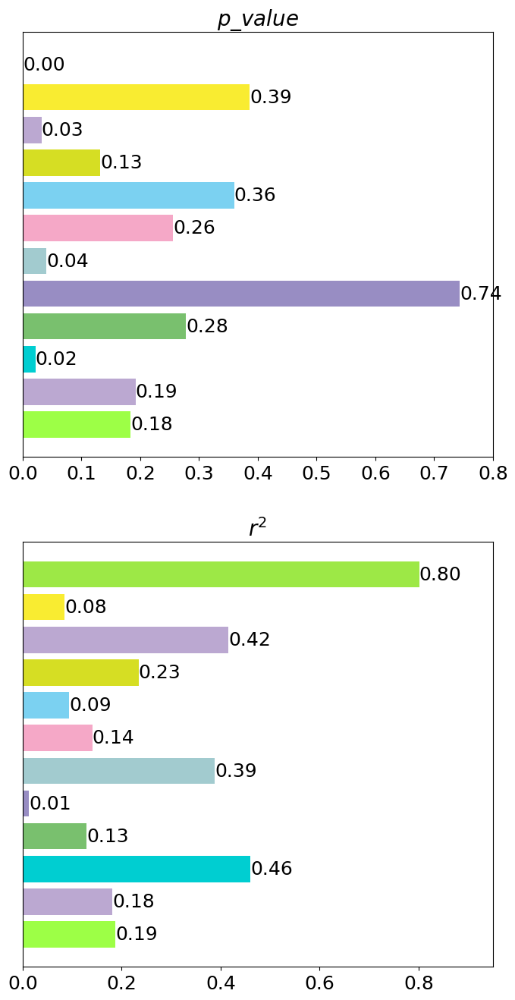

In [63]:
fig, axes = plt.subplots(ncols=1, nrows=2, figsize=(8, 16))

# Given list
colors = ["#9de846", '#F9EC31', "#BBA8D1","#D6DE23", "#7BD1F1", "#F5A8C7",  "#A2CBCF", "#988DC3", "#79c06e",'#00CED1',"#BBA8D1", "#9dff46"]
labels = column

# Create a horizontal bar graph with custom colors
bars = axes[0].barh(labels[::-1], p_list[::-1], color=colors[::-1])

# Add values next to each bar
for bar in bars:
    width = bar.get_width()
    axes[0].text(width, bar.get_y() + bar.get_height() / 2, '%.2f' % width, ha='left', va='center', fontsize=18)

axes[0].set_title("$p\_value$", fontsize=20)
axes[0].set_xlim([0, 0.72])
axes[0].set_ylabel('', fontsize=14)  # Remove y-label title

bars_p = axes[1].barh(labels[::-1], r_list[::-1], color=colors[::-1])

# Add values next to each bar
for bar in bars_p:
    width = bar.get_width()
    if width < 0:
        axes[1].text(0, bar.get_y() + bar.get_height() / 2, '%.2f' % width, ha='left', va='center', fontsize=18)
    else:
        axes[1].text(width, bar.get_y() + bar.get_height() / 2, '%.2f' % width, ha='left', va='center', fontsize=18)

axes[0].set_xlim(0, 0.8)
axes[1].set_xlim(0, 0.95)
axes[1].set_title("$r^2$", fontsize=20)
axes[1].set_ylabel('', fontsize=14)  # Remove y-label title

axes[1].set_yticklabels([])
axes[1].yaxis.set_visible(False)

axes[0].set_yticklabels(labels[::-1], fontsize=20)  # Increase fontsize to 14
axes[1].set_yticklabels(labels[::-1], fontsize=20)  # Increase fontsize to 14

axes[0].set_yticklabels([])
axes[0].yaxis.set_visible(False)

for i, ax in enumerate(axes.flat):
    ax.tick_params(axis='x', labelsize=18)

plt.savefig(out_dir_linear + '/barsh_no_ticks.jpg', dpi=300, bbox_inches='tight')
# Display the graph
plt.show()

/tmp/ipykernel_4096938/1694324565.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes.set_yticklabels(labels[::-1], fontsize=20)  # Increase fontsize to 14


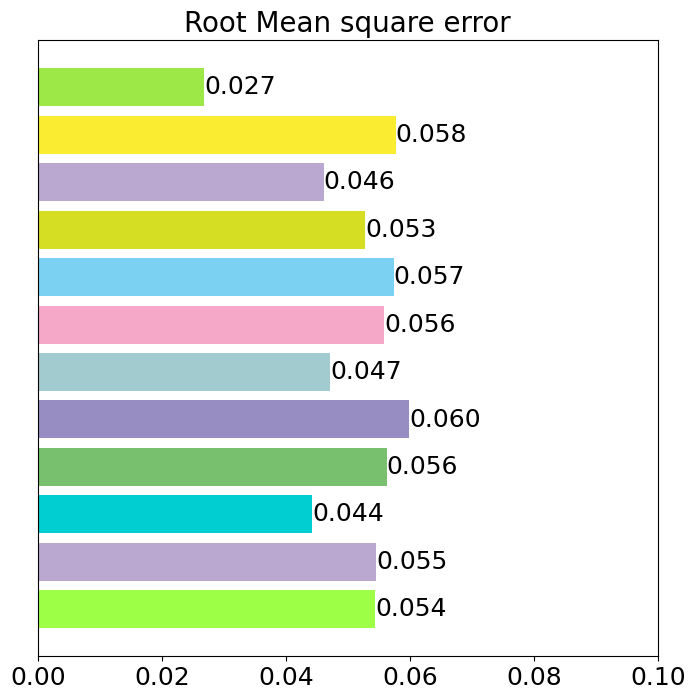

In [64]:
fig, axes = plt.subplots(ncols=1, nrows=1, figsize=(8, 8))

# Given list
colors = ["#9de846", '#F9EC31', "#BBA8D1","#D6DE23", "#7BD1F1", "#F5A8C7",  "#A2CBCF", "#988DC3", "#79c06e",'#00CED1',"#BBA8D1", "#9dff46"]
labels = column

bars = axes.barh(labels[::-1], mse[::-1], color=colors[::-1])

# Add values next to each bar
for bar in bars:
    width = bar.get_width()
    axes.text(width, bar.get_y() + bar.get_height() / 2, '%.3f' % width, ha='left', va='center', fontsize=18)

axes.set_xlim(0, 0.1)
axes.set_title("Root Mean square error", fontsize=20)
axes.set_ylabel('', fontsize=14)  # Remove y-label title

axes.set_yticklabels(labels[::-1], fontsize=20)  # Increase fontsize to 14

axes.set_yticklabels([])
axes.yaxis.set_visible(False)

axes.tick_params(axis='x', labelsize=18)  # Adjust tick parameters for the x-axis

plt.savefig(out_dir_linear + '/mse_no_ticks.jpg', dpi=300, bbox_inches='tight')
# Display the graph
plt.show()

In [65]:
def plot_osm_celltype(celltype=None,celltype_ind=None,save=None,return_fig=False):
    gd_loc = RCTD_coordinates + 0.5
    gd_loc.columns = ['x', 'y']
    if celltype is not None:
        celltype_ind = np.where(celltype == tangram_results.columns)[0]
    elif celltype_ind is not None:
        celltype = tangram_results.columns[celltype_ind]
    else:
        raise Error('error')
    print(celltype)
    c_ind = celltype_ind
    fig,axes = plt.subplots(ncols=6,nrows=2,figsize=(25,12.0))

    s = 80
    axes[0][0].scatter(x=gd_loc['x'],y=gd_loc['y'],c=harmo_results.iloc[:,c_ind],s=s,marker='s')
    axes[0][0].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[0][0].set_xlim(0.5,30.5)
    axes[0][0].set_ylim(25.5,60.5)
    axes[0][0].axis('off')
    axes[0][0].set_title('HarmoDecon', fontsize=28)

    axes[0][1].scatter(x=gd_loc['x'],y=gd_loc['y'],c=RCTD_results.iloc[:,c_ind],s=s,marker='s')
    axes[0][1].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[0][1].set_xlim(0.5,30.5)
    axes[0][1].set_ylim(25.5,60.5)
    axes[0][1].axis('off')
    axes[0][1].set_title('RCTD', fontsize=28)

    axes[0][2].scatter(x=gd_loc['x'],y=gd_loc['y'],c=red_results.iloc[:,c_ind],s=s,marker='s')
    axes[0][2].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[0][2].set_xlim(0.5,30.5)
    axes[0][2].set_ylim(25.5,60.5)
    axes[0][2].axis('off')
    axes[0][2].set_title('Redeconve', fontsize=28)

    axes[0][3].scatter(x=gd_loc['x'],y=gd_loc['y'],c=stdgcn_results.iloc[:,c_ind],s=s,marker='s')
    axes[0][3].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[0][3].set_xlim(0.5,30.5)
    axes[0][3].set_ylim(25.5,60.5)
    axes[0][3].axis('off')
    axes[0][3].set_title('StdGCN', fontsize=28)

    axes[0][4].scatter(x=gd_loc['x'],y=gd_loc['y'],c=stereo_results.iloc[:,c_ind],s=s,marker='s')
    axes[0][4].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[0][4].set_xlim(0.5,30.5)
    axes[0][4].set_ylim(25.5,60.5)
    axes[0][4].axis('off')
    axes[0][4].set_title('Stereoscope', fontsize=28)
    
    axes[0][5].scatter(x=gd_loc['x'],y=gd_loc['y'],c=spacel_results.iloc[:,c_ind],s=s,marker='s')
    axes[0][5].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[0][5].set_xlim(0.5,30.5)
    axes[0][5].set_ylim(25.5,60.5)
    axes[0][5].axis('off')
    axes[0][5].set_title('SPACEL', fontsize=28)
    
    axes[1][0].scatter(x=gd_loc['x'],y=gd_loc['y'],c=cell2loc_results.iloc[:,c_ind],s=s,marker='s')
    axes[1][0].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[1][0].set_xlim(0.5,30.5)
    axes[1][0].set_ylim(25.5,60.5)
    axes[1][0].axis('off')
    axes[1][0].set_title('Cell2location', fontsize=28)
    
    axes[1][1].scatter(x=gd_loc['x'],y=gd_loc['y'],c=tangram_results.iloc[:,c_ind],s=s,marker='s')
    axes[1][1].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[1][1].set_xlim(0.5,30.5)
    axes[1][1].set_ylim(25.5,60.5)
    axes[1][1].axis('off')
    axes[1][1].set_title('Tangram', fontsize=28)

    axes[1][2].scatter(x=gd_loc['x'],y=gd_loc['y'],c=spatialdwls_results.iloc[:,c_ind],s=s,marker='s')
    axes[1][2].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[1][2].set_xlim(0.5,30.5)
    axes[1][2].set_ylim(25.5,60.5)
    axes[1][2].axis('off')
    axes[1][2].set_title('SpatialDWLS', fontsize=28)

    axes[1][3].scatter(x=gd_loc['x'],y=gd_loc['y'],c=spotlight_results.iloc[:,c_ind],s=s,marker='s')
    axes[1][3].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[1][3].set_xlim(0.5,30.5)
    axes[1][3].set_ylim(25.5,60.5)
    axes[1][3].axis('off')
    axes[1][3].set_title('Spotlight', fontsize=28)

    axes[1][4].scatter(x=gd_loc['x'],y=gd_loc['y'],c=card_results.iloc[:,c_ind],s=s,marker='s')
    axes[1][4].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[1][4].set_xlim(0.5,30.5)
    axes[1][4].set_ylim(25.5,60.5)
    axes[1][4].axis('off')
    axes[1][4].set_title('CARD', fontsize=28)

    axes[1][5].scatter(x=gd_loc['x'],y=gd_loc['y'],c=dstg_results.iloc[:,c_ind],s=s,marker='s')
    axes[1][5].scatter(x=15,y=60,c=0,s=s,marker='s',)
    axes[1][5].set_xlim(0.5,30.5)
    axes[1][5].set_ylim(25.5,60.5)
    axes[1][5].axis('off')
    axes[1][5].set_title('DSTG', fontsize=28)
    
    
    if save is not None:
        plt.savefig(save,bbox_inches='tight',dpi=300)
    if not return_fig:
        plt.show()
    else:
        plt.close()
        return fig

In [66]:
import warnings
# Disable all warning messages
warnings.filterwarnings("ignore")

L2/3 IT CTX-1


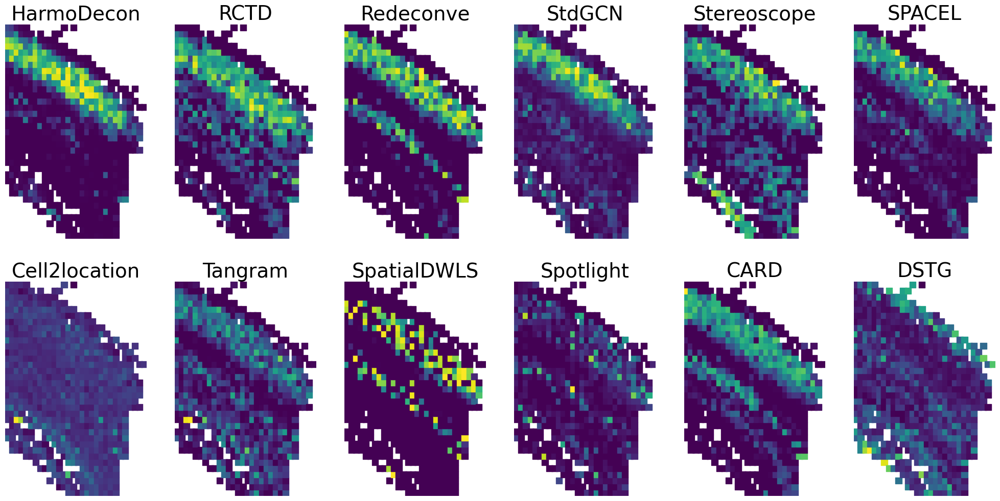

L4/5 IT CTX


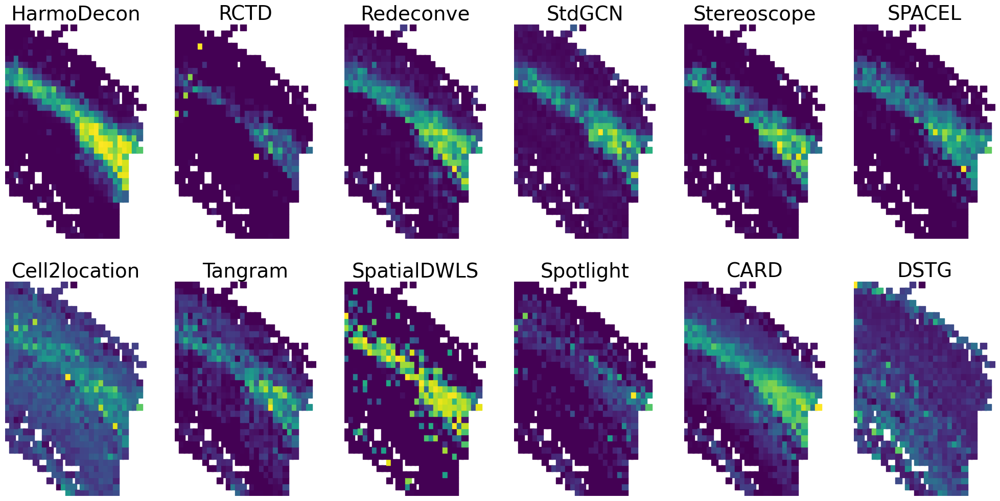

L5 IT CTX


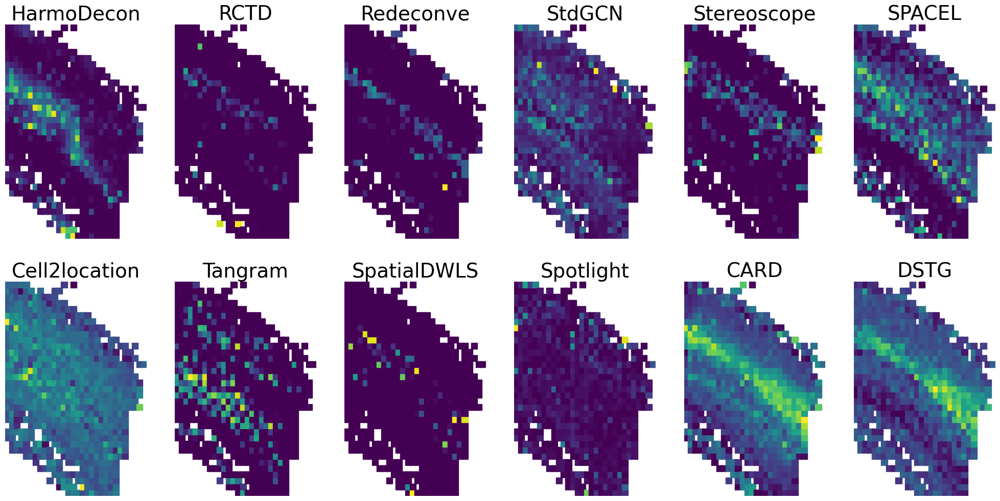

L5 NP CTX


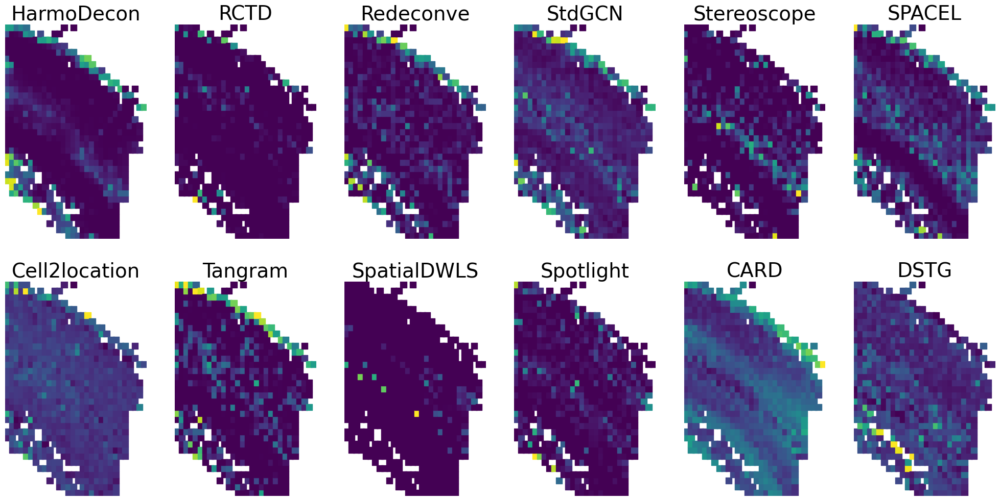

L5 PT CTX


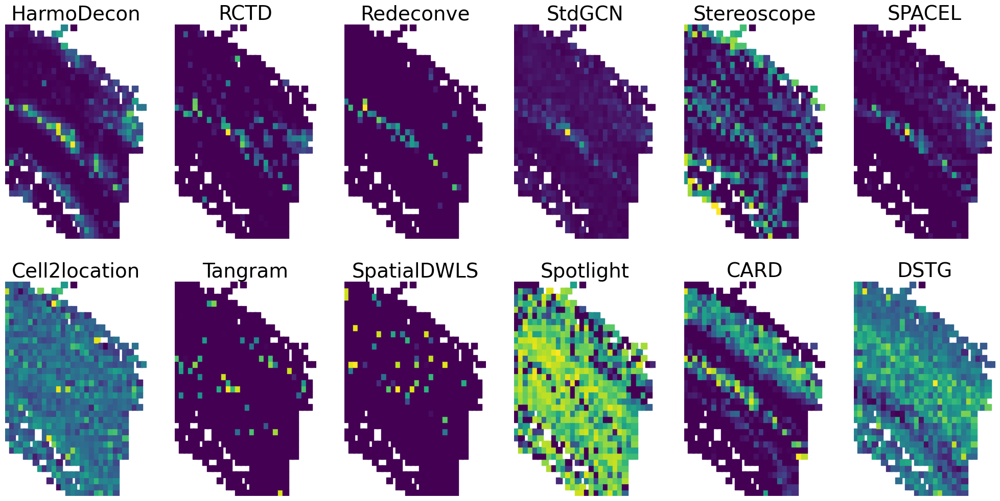

L6 CT CTX


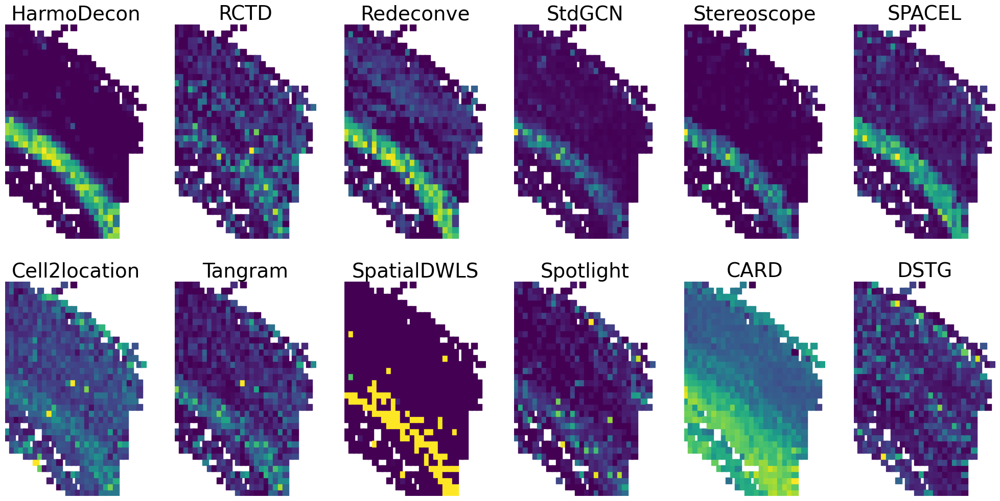

L6 IT CTX


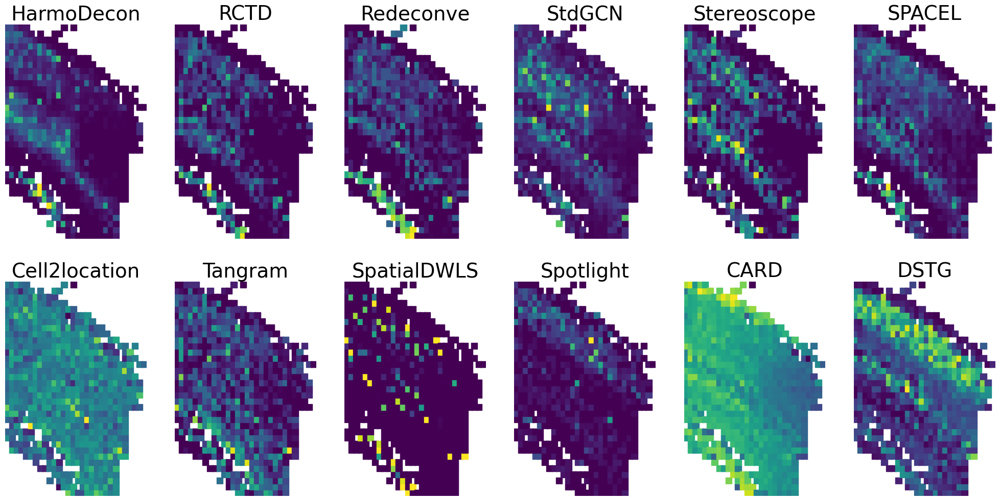

L6b CTX


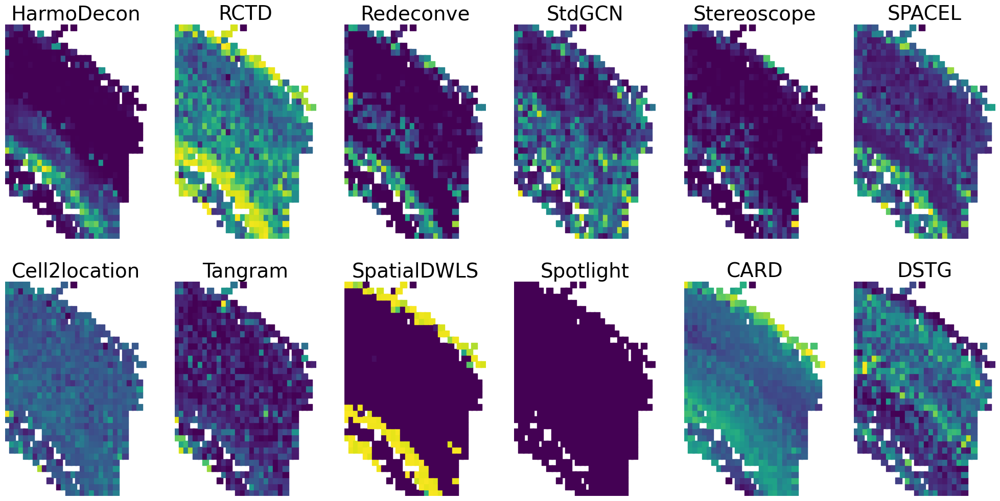

In [67]:
plot_osm_celltype(celltype_ind=0,save=output_dir + '/osm_L2-3_IT_methods_red.jpg')
plot_osm_celltype(celltype_ind=1,save=output_dir + '/osm_L4-5_IT_methods_red.jpg')
plot_osm_celltype(celltype_ind=2,save=output_dir + '/osm_L5_IT_methods_red.jpg')
plot_osm_celltype(celltype_ind=3,save=output_dir + '/osm_L5_NP_methods_red.jpg')
plot_osm_celltype(celltype_ind=4,save=output_dir + '/osm_L5_PT_methods_red.jpg')
plot_osm_celltype(celltype_ind=5,save=output_dir + '/osm_L6_CT_methods_red.jpg')
plot_osm_celltype(celltype_ind=6,save=output_dir + '/osm_L6_IT_methods_red.jpg')
plot_osm_celltype(celltype_ind=7,save=output_dir + '/osm_L6b_methods_red.jpg')

In [71]:
gd_results = pd.read_table('/home/comp/cszrwang/data/osmfish/osmfish.cell_proportion.txt', sep = '\t', header = 0, index_col = 0)
gd_results = (gd_results.T/gd_results.sum(axis=1)).T
gd_loc = pd.read_csv('/home/comp/cszrwang/data/osmfish/osm_cor.txt',sep='\t')

In [68]:
def plot_gd(celltype=None,celltype_ind=None,save=None,return_fig=False):
#     gd_loc = RCTD_coordinates + 0.5
#     gd_loc.columns = ['x', 'y']
    if celltype is not None:
        celltype_ind = np.where(celltype == tangram_results.columns)[0]
    elif celltype_ind is not None:
        celltype = tangram_results.columns[celltype_ind]
    else:
        raise Error('error')
    print(celltype)
    c_ind = celltype_ind
    fig,axes = plt.subplots(ncols=1,nrows=1,figsize=(3,4.0))
    # fig.tight_layout()
#     axes[0][0].scatter(x=gd_loc['x'],y=gd_loc['y'],c=gd_results.iloc[:,c_ind],s=1000,marker='s')
#     axes[0][0].scatter(x=5,y=18,c=0,s=1000,marker='s')
#     axes[0][0].set_xlim(-0.5,9.5)
#     axes[0][0].set_ylim(-0.5,18.5)
#     axes[0][0].axis('off')
#     axes[0][0].set_title('Ground Truth')
    
    axes.scatter(x=gd_loc['x'],y=gd_loc['y'],c=gd_results.iloc[:,c_ind],s=50,marker='s')
    axes.scatter(x=15,y=60,c=0,s=50,marker='s',)
    axes.set_xlim(0.5,30.5)
    axes.set_ylim(25.5,60.5)
    axes.axis('off')
    axes.set_title('Ground Truth', fontsize=20)
    
    
    if save is not None:
        plt.savefig(save,bbox_inches='tight',dpi=300)
    if not return_fig:
        plt.show()
    else:
        plt.close()
        return fig

L2/3 IT CTX-1


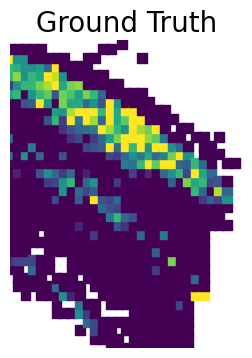

L4/5 IT CTX


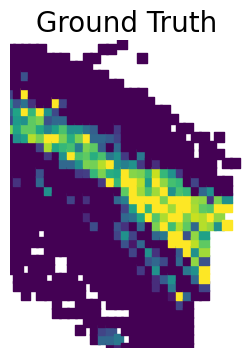

L5 IT CTX


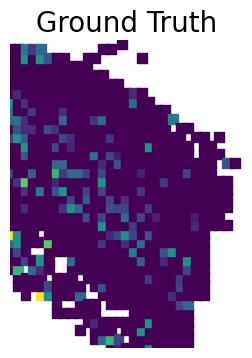

L5 NP CTX


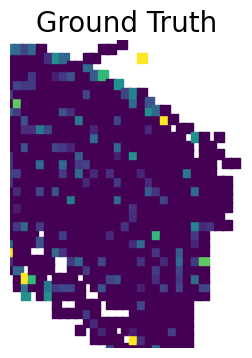

L5 PT CTX


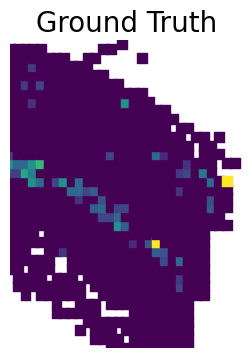

L6 CT CTX


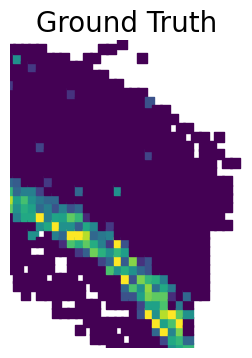

L6 IT CTX


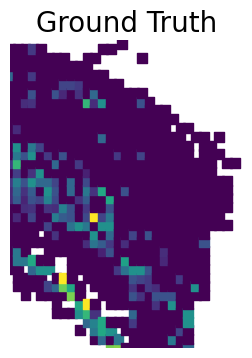

L6b CTX


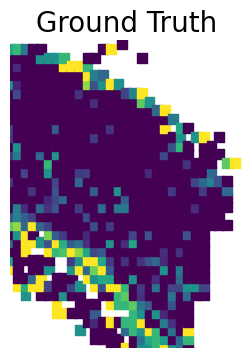

In [72]:
plot_gd(celltype_ind=0,save=output_dir + '/osm_L2-3_IT_gd.jpg')
plot_gd(celltype_ind=1,save=output_dir + '/osm_L4-5_IT_gd.jpg')
plot_gd(celltype_ind=2,save=output_dir + '/osm_L5_IT_gd.jpg')
plot_gd(celltype_ind=3,save=output_dir + '/osm_L5_NP_gd.jpg')
plot_gd(celltype_ind=4,save=output_dir + '/osm_L5_PT_gd.jpg')
plot_gd(celltype_ind=5,save=output_dir + '/osm_L6_CT_gd.jpg')
plot_gd(celltype_ind=6,save=output_dir + '/osm_L6_IT_gd.jpg')
plot_gd(celltype_ind=7,save=output_dir + '/osm_L6b_gd.jpg')

In [73]:
def plot_results_bulk_ST_by_spot(coordinates, metadata, dir_out, output_prefix, geometry='honeycomb', num_cols=3):
 
    # Define output files
    fout_png_all = os.path.join(dir_out, f"{output_prefix}cell_type_assignments_by_spot.png")
    fout_pdf_all = os.path.join(dir_out, f"{output_prefix}cell_type_assignments_by_spot.pdf")
    
#     coordinates = coordinates.loc[metadata.index,:]
#     cell_types = list(metadata.columns)[:-1]
    cell_types = list(metadata.columns)
    cell_types = list(np.sort(cell_types))
#     cell_types.insert(0,'Total cells')

    X = coordinates.iloc[:,0]
    Y = coordinates.iloc[:,1]
    
    # distinguish between row/col indices and coordinates
    # based on range (500) and type (int vs. float) of values
    scale = Y.max() < 500 and ((Y - Y.round()).abs() < 1e-5).all()

    # define representative interval between each adjacent spot/point
    y_int = 1 if scale else np.median(np.unique(np.diff(np.sort(np.unique(Y)))))
    x_int = 1 if scale else np.median(np.unique(np.diff(np.sort(np.unique(X)))))
    
    if geometry == 'honeycomb' and scale:
        print('Detecting row and column indexing of Visium data; rescaling for coordinates')
        
        # Rotate
        X_prev = X
        Y_prev = Y
        X = Y_prev
        Y = 1-X_prev
        
        # Rescale
        Y = 1.75*Y

    elif geometry == 'square' and scale:
        print('Detecting row and column indexing of legacy ST data; rotating for coordinates')
        
        # Rotate
        X_prev = X
        Y_prev = Y
        X = Y_prev
        Y = 1-X_prev

    else:        
        # Rotate 
        Y = 1-Y
        
    if geometry == 'honeycomb':
        hex_vert = 6

        if scale:
            hex_rot = 0
            hex_rad = y_int
            hex_rad = hex_rad + 0.2*hex_rad

        else:
            hex_rot = 0
            hex_rad = x_int
            hex_rad = hex_rad + 0.28*hex_rad

    elif geometry == 'square':
        hex_vert = 4
        hex_rot = 45
        interval = y_int
        hex_rad = 0.5*np.sqrt(2*interval**2)

    else:
        print("Unknown geometry specified.")
        exit()

    num_rows = int(len(cell_types)/num_cols)
    if num_rows*num_cols < len(cell_types):
        num_rows = num_rows+1
    width = max(X)-min(X)
    height = max(Y)-min(Y)

    plt.rc('font', **{'family': 'sans-serif', 'sans-serif': ['Arial'], 'size':'12'})
    plt.rcParams['figure.dpi'] = 450
    plt.rcParams['savefig.dpi'] = 450

    fig, axes = plt.subplots(num_rows,num_cols,figsize=(width/height*3*num_cols,3*num_rows))
    full_frac = 0.047 * (3*num_rows / (width/height*3*num_cols))
    k = 0
    for i in range(num_rows):
        for j in range(num_cols):

            ax = axes[i,j]

            if k >= len(cell_types):
                ax.axis('off')
            else:
                ct = cell_types[k]
                ax.set_aspect('equal')

                node_assignment = metadata.loc[:,ct]

                viridis = cm.get_cmap('viridis')
                norm = matplotlib.colors.Normalize(min(node_assignment), max(node_assignment))

                node_assignment = (1/max(node_assignment))*node_assignment
                colors = viridis(node_assignment)

                for x, y, c in zip(X, Y, colors):
                    hex = RegularPolygon((x, y), numVertices=hex_vert, radius=hex_rad, 
                                         orientation=np.radians(hex_rot), 
                                         facecolor=c, edgecolor=None)
                    ax.add_patch(hex)

                # Also add scatter points in hexagon centres - not sure why this line has to be here
                ax.scatter(X, Y, c=[c[0] for c in colors],alpha=0)
                ct_label = ct
                # Reformat labels that are too long
                if len(ct_label)>14:
                    ct_label = format_label(ct_label)
                ax.set_title(ct_label)
                cax = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=viridis),ax=ax,label='',fraction=0.036, pad = 0.04)
                ax.axis('off')

            k += 1

    fig.tight_layout()
    fig.subplots_adjust(top=0.92)
#     fig.suptitle('Ratio of cells per spot deconvoluted by HarmoDecon')
    plt.show()
    fig.savefig(fout_png_all, facecolor="w", bbox_inches='tight')
    fig.savefig(fout_pdf_all, facecolor="w", bbox_inches='tight')

In [81]:
def plot_results_bulk_ST_by_spot(coordinates, metadata, dir_out, output_prefix, geometry='honeycomb', num_cols=3):
 
    # Define output files
    fout_png_all = os.path.join(dir_out, f"{output_prefix}cell_type_assignments_by_spot.png")
    fout_pdf_all = os.path.join(dir_out, f"{output_prefix}cell_type_assignments_by_spot.pdf")
    
#     coordinates = coordinates.loc[metadata.index,:]
#     cell_types = list(metadata.columns)[:-1]
    cell_types = list(metadata.columns)
    cell_types = list(np.sort(cell_types))
#     cell_types.insert(0,'Total cells')

    X = coordinates.iloc[:,0]
    Y = coordinates.iloc[:,1]
    
    # distinguish between row/col indices and coordinates
    # based on range (500) and type (int vs. float) of values
    scale = Y.max() < 500 and ((Y - Y.round()).abs() < 1e-5).all()

    # define representative interval between each adjacent spot/point
    y_int = 1 if scale else np.median(np.unique(np.diff(np.sort(np.unique(Y)))))
    x_int = 1 if scale else np.median(np.unique(np.diff(np.sort(np.unique(X)))))
    
    if geometry == 'honeycomb' and scale:
        print('Detecting row and column indexing of Visium data; rescaling for coordinates')
        
        # Rotate
        X_prev = X
        Y_prev = Y
        X = Y_prev
        Y = 1-X_prev
        
        # Rescale
        Y = 1.75*Y

    elif geometry == 'square' and scale:
        print('Detecting row and column indexing of legacy ST data; rotating for coordinates')
        
        # Rotate
        X_prev = X
        Y_prev = Y
        X = Y_prev
        Y = 1-X_prev

    else:        
        # Rotate 
        Y = 1-Y
        
    if geometry == 'honeycomb':
        hex_vert = 6

        if scale:
            hex_rot = 0
            hex_rad = y_int
            hex_rad = hex_rad + 0.2*hex_rad

        else:
            hex_rot = 0
            hex_rad = x_int
            hex_rad = hex_rad + 0.28*hex_rad

    elif geometry == 'square':
        hex_vert = 4
        hex_rot = 45
        interval = y_int
        hex_rad = 0.5*np.sqrt(2*interval**2)

    else:
        print("Unknown geometry specified.")
        exit()

    num_rows = int(len(cell_types)/num_cols)
    if num_rows*num_cols < len(cell_types):
        num_rows = num_rows+1
    width = max(X)-min(X)
    height = max(Y)-min(Y)

#     plt.rc('font', **{'family': 'sans-serif', 'sans-serif': ['sans-serif'], 'size':'12'})
    plt.rcParams['figure.dpi'] = 450
    plt.rcParams['savefig.dpi'] = 450

    fig, axes = plt.subplots(num_rows,num_cols,figsize=(width/height*3*num_cols,3*num_rows))
    full_frac = 0.047 * (3*num_rows / (width/height*3*num_cols))
    k = 0
    for i in range(num_rows):
        for j in range(num_cols):

            ax = axes[i,j]

            if k >= len(cell_types):
                ax.axis('off')
            else:
                ct = cell_types[k]
                ax.set_aspect('equal')

                node_assignment = metadata.loc[:,ct]

                viridis = cm.get_cmap('viridis')
                norm = matplotlib.colors.Normalize(min(node_assignment), max(node_assignment))

                node_assignment = (1/max(node_assignment))*node_assignment
                colors = viridis(node_assignment)

                for x, y, c in zip(X, Y, colors):
                    hex = RegularPolygon((x, y), numVertices=hex_vert, radius=hex_rad, 
                                         orientation=np.radians(hex_rot), 
                                         facecolor=c, edgecolor=None)
                    ax.add_patch(hex)

                # Also add scatter points in hexagon centres - not sure why this line has to be here
                ax.scatter(X, Y, c=[c[0] for c in colors],alpha=0)
                ct_label = ct
                # Reformat labels that are too long
                if len(ct_label)>14:
                    ct_label = format_label(ct_label)
                ax.set_title(ct_label)
                cax = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=viridis),ax=ax,label='',fraction=0.036, pad = 0.04)
                
                ticks = cax.get_ticks()
            
                ticks = cax.get_ticks()

                new_ticks = np.linspace(norm.vmin, norm.vmax, len(ticks))

                cax.set_ticks(new_ticks)
                cax.set_ticklabels([f'{tick:.2f}' for tick in new_ticks])

                ax.axis('off')
        
            k += 1

    fig.tight_layout()
    fig.subplots_adjust(top=0.92)
#     fig.suptitle('Distribution of Malignmant Cells and Marker Genes')
    plt.show()
    fig.savefig(fout_png_all, facecolor="w", bbox_inches='tight')
    fig.savefig(fout_pdf_all, facecolor="w", bbox_inches='tight')

In [74]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch, RegularPolygon
from matplotlib import cm, colors
import matplotlib

import numpy as np
import pandas as pd

import os

In [75]:
def format_label(label,max_length=14,max_lines=3):
    label_words = label.split(' ')
    label_chunks = []
    chunk = ''
    for word in label_words:
        if len(chunk)==0:
            if len(word)>max_length:
                word = word[:max_length]+'...'
                label_chunks.append(word)
            else:
                chunk += word
        elif len(chunk)+len(word)<=(max_length-1):
            chunk = chunk+' '+word
        else:
            label_chunks.append(chunk)
            chunk = word
    if len(chunk)>0:
        label_chunks.append(chunk)
    
    if len(label_chunks)>max_lines:
        label_chunks = label_chunks[:max_lines]
        last_line = label_chunks[-1]
        if len(last_line)>(max_length-3):
            label_chunks[-1] = last_line[:max_length]+'...'
        else: 
            label_chunks[-1] = last_line+'...'

    return '\n'.join(label_chunks)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

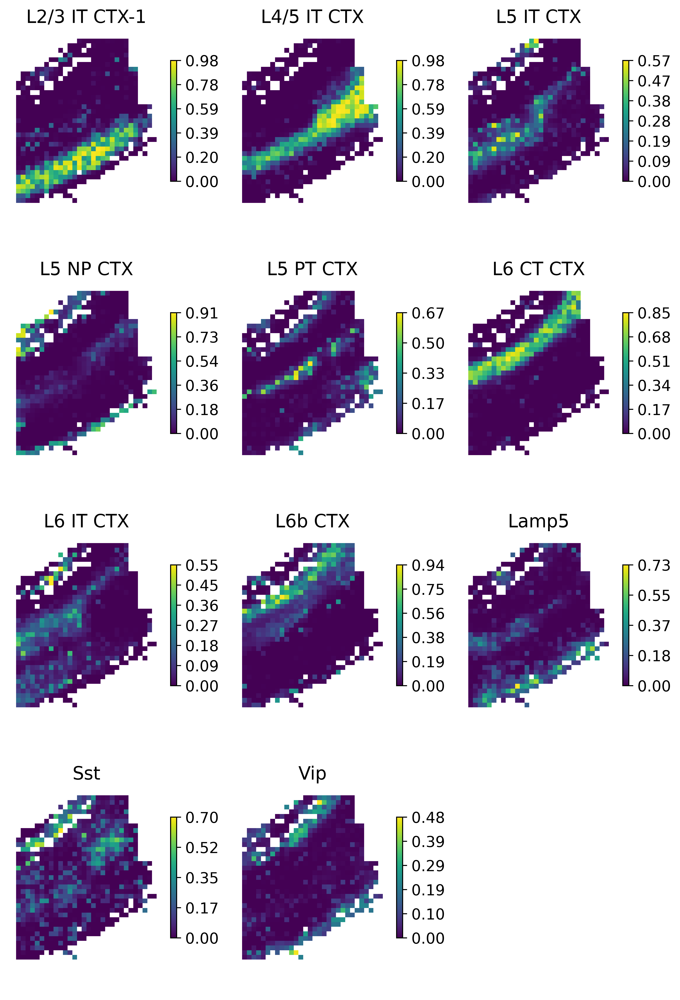

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [82]:
dir_out = "/home/comp/cszrwang/results/Deconvolution/results/osmFISH/Figures/"
output_prefix = "harmo"
plot_results_bulk_ST_by_spot(RCTD_coordinates, harmo_results, dir_out, output_prefix, geometry='square', num_cols=3)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

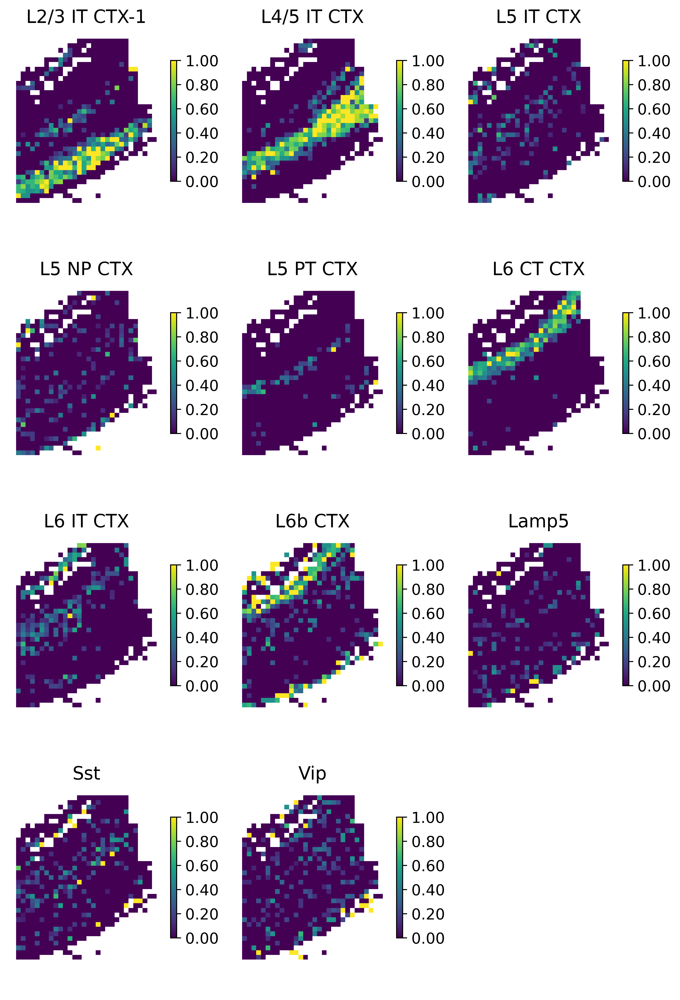

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


In [83]:
dir_out = "/home/comp/cszrwang/results/Deconvolution/results/osmFISH/Figures/"
output_prefix = "gd"
plot_results_bulk_ST_by_spot(coordinates, gd_results, dir_out, output_prefix, geometry='square', num_cols=3)